In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [2]:
df = pd.read_csv("C:\\Users\\Kalpe\\Desktop\\Quake_AI_Fusion\\Data Preprosse_LR_DTR_GENAI\\earthquake.csv")


In [15]:
import warnings
warnings.filterwarnings('ignore')

In [16]:
df.head()

,latitude(+ve-North)(-ve-South),longitude(+ve-East&-ve-West),depth(km),mag,id,hour,date
0,34.189835,-117.58800,6.000,1.70,ci12317071,0,01-01-1973
1,-9.214000,150.63400,41.000,5.30,usp0000001,3,01-01-1973
2,48.308666,-122.11733,13.680,2.20,uw10840118,4,01-01-1973
3,-15.012000,-173.95800,33.000,5.00,usp0000002,5,01-01-1973
4,19.443666,-155.36084,7.302,1.85,hv19723167,7,01-01-1973


In [17]:
df.tail()

,latitude(+ve-North)(-ve-South),longitude(+ve-East&-ve-West),depth(km),mag,id,hour,date
1048570,35.406666,-120.972000,4.996,2.16,nc532631,15,08-11-1997
1048571,-29.489000,-179.065000,300.000,3.90,usp0008aa5,15,08-11-1997
1048572,37.631332,-118.846664,2.856,1.27,nc40040721,15,08-11-1997
1048573,37.650333,-118.854330,2.536,0.94,nc40040720,15,08-11-1997
1048574,44.086000,7.943000,10.000,2.20,usp0008aa4,15,08-11-1997


In [18]:
df.shape

(1048575, 7)

In [19]:
df.columns

Index(['latitude(+ve-North)(-ve-South)', 'longitude(+ve-East&-ve-West)',
       'depth(km)', 'mag', 'id', 'hour', 'date'],
      dtype='object')

In [20]:
df.duplicated().sum()

0

In [21]:
df.isnull().sum()

latitude(+ve-North)(-ve-South)    0
longitude(+ve-East&-ve-West)      0
depth(km)                         0
mag                               0
id                                0
hour                              0
date                              0
dtype: int64

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 7 columns):
 #   Column                          Non-Null Count    Dtype  
---  ------                          --------------    -----  
 0   latitude(+ve-North)(-ve-South)  1048575 non-null  float64
 1   longitude(+ve-East&-ve-West)    1048575 non-null  float64
 2   depth(km)                       1048575 non-null  float64
 3   mag                             1048575 non-null  float64
 4   id                              1048575 non-null  object 
 5   hour                            1048575 non-null  int64  
 6   date                            1048575 non-null  object 
dtypes: float64(4), int64(1), object(2)
memory usage: 56.0+ MB


In [23]:
df.describe()

,latitude(+ve-North)(-ve-South),longitude(+ve-East&-ve-West),depth(km),mag,hour
count,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06
mean,3.290551e+01,-9.292454e+01,1.912356e+01,2.087926e+00,1.134486e+01
std,1.696636e+01,7.803025e+01,5.437885e+01,1.286230e+00,6.855554e+00
min,-8.206400e+01,-1.799990e+02,0.000000e+00,-9.990000e+00,0.000000e+00
25%,3.355408e+01,-1.222340e+02,3.339000e+00,1.190000e+00,5.000000e+00
50%,3.655767e+01,-1.187110e+02,6.348000e+00,1.730000e+00,1.100000e+01
75%,3.880967e+01,-1.161300e+02,1.139600e+01,2.570000e+00,1.700000e+01
max,8.722100e+01,1.800000e+02,7.000000e+02,8.310000e+00,2.300000e+01


In [24]:
df= df.drop('id',axis=1)

In [25]:
df

,latitude(+ve-North)(-ve-South),longitude(+ve-East&-ve-West),depth(km),mag,hour,date
0,34.189835,-117.588000,6.000,1.70,0,01-01-1973
1,-9.214000,150.634000,41.000,5.30,3,01-01-1973
2,48.308666,-122.117330,13.680,2.20,4,01-01-1973
3,-15.012000,-173.958000,33.000,5.00,5,01-01-1973
4,19.443666,-155.360840,7.302,1.85,7,01-01-1973
...,...,...,...,...,...,...
1048570,35.406666,-120.972000,4.996,2.16,15,08-11-1997
1048571,-29.489000,-179.065000,300.000,3.90,15,08-11-1997
1048572,37.631332,-118.846664,2.856,1.27,15,08-11-1997
1048573,37.650333,-118.854330,2.536,0.94,15,08-11-1997


In [26]:
df['date'] = pd.to_datetime(df['date'])

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 6 columns):
 #   Column                          Non-Null Count    Dtype         
---  ------                          --------------    -----         
 0   latitude(+ve-North)(-ve-South)  1048575 non-null  float64       
 1   longitude(+ve-East&-ve-West)    1048575 non-null  float64       
 2   depth(km)                       1048575 non-null  float64       
 3   mag                             1048575 non-null  float64       
 4   hour                            1048575 non-null  int64         
 5   date                            1048575 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 48.0 MB


In [28]:
#Check values are positive or not if not then convert into positive
df['depth(km)'] = df['depth(km)'].abs()
df['mag'] = df['mag'].abs()
df['hour']= df['hour'].abs()

In [29]:
df['day'] = df['date'].dt.day
df['month'] = df['date'].dt.month
df['year'] = df['date'].dt.year

In [30]:
df

,latitude(+ve-North)(-ve-South),longitude(+ve-East&-ve-West),depth(km),mag,hour,date,day,month,year
0,34.189835,-117.588000,6.000,1.70,0,1973-01-01,1,1,1973
1,-9.214000,150.634000,41.000,5.30,3,1973-01-01,1,1,1973
2,48.308666,-122.117330,13.680,2.20,4,1973-01-01,1,1,1973
3,-15.012000,-173.958000,33.000,5.00,5,1973-01-01,1,1,1973
4,19.443666,-155.360840,7.302,1.85,7,1973-01-01,1,1,1973
...,...,...,...,...,...,...,...,...,...
1048570,35.406666,-120.972000,4.996,2.16,15,1997-08-11,11,8,1997
1048571,-29.489000,-179.065000,300.000,3.90,15,1997-08-11,11,8,1997
1048572,37.631332,-118.846664,2.856,1.27,15,1997-08-11,11,8,1997
1048573,37.650333,-118.854330,2.536,0.94,15,1997-08-11,11,8,1997


In [31]:
def get_season(month):
    
    if month in [12,1,2]:
        return 'Winter'
    elif month in [3,4,5]:
        return 'Spring'
    elif month in [6,7,8]:
        return 'Summer'
    else:
        return 'Autumn'
df['season'] = df['month'].apply(get_season)

In [32]:
df['day_of_week']= df['date'].dt.dayofweek

In [33]:
df['is_weekend'] = df['day_of_week'].apply(lambda x: 1 if x >= 5 else 0) # for saturday or sunday (both are weekend days) its 1

In [34]:
df

,latitude(+ve-North)(-ve-South),longitude(+ve-East&-ve-West),depth(km),mag,hour,date,day,month,year,season,day_of_week,is_weekend
0,34.189835,-117.588000,6.000,1.70,0,1973-01-01,1,1,1973,Winter,0,0
1,-9.214000,150.634000,41.000,5.30,3,1973-01-01,1,1,1973,Winter,0,0
2,48.308666,-122.117330,13.680,2.20,4,1973-01-01,1,1,1973,Winter,0,0
3,-15.012000,-173.958000,33.000,5.00,5,1973-01-01,1,1,1973,Winter,0,0
4,19.443666,-155.360840,7.302,1.85,7,1973-01-01,1,1,1973,Winter,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1048570,35.406666,-120.972000,4.996,2.16,15,1997-08-11,11,8,1997,Summer,0,0
1048571,-29.489000,-179.065000,300.000,3.90,15,1997-08-11,11,8,1997,Summer,0,0
1048572,37.631332,-118.846664,2.856,1.27,15,1997-08-11,11,8,1997,Summer,0,0
1048573,37.650333,-118.854330,2.536,0.94,15,1997-08-11,11,8,1997,Summer,0,0


In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 12 columns):
 #   Column                          Non-Null Count    Dtype         
---  ------                          --------------    -----         
 0   latitude(+ve-North)(-ve-South)  1048575 non-null  float64       
 1   longitude(+ve-East&-ve-West)    1048575 non-null  float64       
 2   depth(km)                       1048575 non-null  float64       
 3   mag                             1048575 non-null  float64       
 4   hour                            1048575 non-null  int64         
 5   date                            1048575 non-null  datetime64[ns]
 6   day                             1048575 non-null  int64         
 7   month                           1048575 non-null  int64         
 8   year                            1048575 non-null  int64         
 9   season                          1048575 non-null  object        
 10  day_of_week                     1048575 no

In [36]:
df.describe()

,latitude(+ve-North)(-ve-South),longitude(+ve-East&-ve-West),depth(km),mag,hour,day,month,year,day_of_week,is_weekend
count,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06
mean,3.290551e+01,-9.292454e+01,1.912356e+01,2.091813e+00,1.134486e+01,1.582330e+01,6.524468e+00,1.988176e+03,3.011111e+00,2.895139e-01
std,1.696636e+01,7.803025e+01,5.437885e+01,1.279899e+00,6.855554e+00,8.815723e+00,3.425199e+00,6.232183e+00,2.006293e+00,4.535370e-01
min,-8.206400e+01,-1.799990e+02,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.973000e+03,0.000000e+00,0.000000e+00
25%,3.355408e+01,-1.222340e+02,3.339000e+00,1.190000e+00,5.000000e+00,8.000000e+00,4.000000e+00,1.984000e+03,1.000000e+00,0.000000e+00
50%,3.655767e+01,-1.187110e+02,6.348000e+00,1.730000e+00,1.100000e+01,1.600000e+01,7.000000e+00,1.989000e+03,3.000000e+00,0.000000e+00
75%,3.880967e+01,-1.161300e+02,1.139600e+01,2.580000e+00,1.700000e+01,2.400000e+01,9.000000e+00,1.993000e+03,5.000000e+00,1.000000e+00
max,8.722100e+01,1.800000e+02,7.000000e+02,9.990000e+00,2.300000e+01,3.100000e+01,1.200000e+01,1.997000e+03,6.000000e+00,1.000000e+00


In [37]:
mean_latitude = df['latitude(+ve-North)(-ve-South)'].mean()
mean_longitude = df['longitude(+ve-East&-ve-West)'].mean()
print(mean_latitude ) 
print(mean_longitude)


32.905510626180735
-92.92454220924614


In [38]:
median_latitude = df['latitude(+ve-North)(-ve-South)'].median()
median_longitude = df['longitude(+ve-East&-ve-West)'].median()
print(median_latitude ) 
print(median_longitude)

36.557667
-118.711


In [39]:
print(abs(median_latitude - mean_latitude)) 
print(abs(median_longitude - mean_longitude))

if abs(median_latitude - mean_latitude) < abs(median_longitude - mean_longitude):
     # If difference in latitude is smaller, use mean latitude
    reference_latitude = mean_latitude
    reference_longitude = mean_longitude
else:
     # If difference in longitude is smaller, use mean longitude
    reference_latitude = median_latitude
    reference_longitude = median_longitude
    
print("Chosen Reference Latitude:", reference_latitude)
print("Chosen Reference Longitude:", reference_longitude)

3.652156373819267
25.786457790753857
Chosen Reference Latitude: 32.905510626180735
Chosen Reference Longitude: -92.92454220924614


In [40]:
df['distance_from_epicenter'] = np.sqrt((df['latitude(+ve-North)(-ve-South)'] - reference_latitude)**2 + (df['longitude(+ve-East&-ve-West)'] - reference_longitude)**2)

In [41]:
df['day_of_year'] = df['date'].dt.dayofyear

In [42]:
df['magnitude_category'] = pd.cut(df['mag'], bins=[0, 5.0, 7.0, np.inf], labels=['small', 'medium', 'large'], include_lowest=True)

In [43]:
df.columns

Index(['latitude(+ve-North)(-ve-South)', 'longitude(+ve-East&-ve-West)',
       'depth(km)', 'mag', 'hour', 'date', 'day', 'month', 'year', 'season',
       'day_of_week', 'is_weekend', 'distance_from_epicenter', 'day_of_year',
       'magnitude_category'],
      dtype='object')

In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 15 columns):
 #   Column                          Non-Null Count    Dtype         
---  ------                          --------------    -----         
 0   latitude(+ve-North)(-ve-South)  1048575 non-null  float64       
 1   longitude(+ve-East&-ve-West)    1048575 non-null  float64       
 2   depth(km)                       1048575 non-null  float64       
 3   mag                             1048575 non-null  float64       
 4   hour                            1048575 non-null  int64         
 5   date                            1048575 non-null  datetime64[ns]
 6   day                             1048575 non-null  int64         
 7   month                           1048575 non-null  int64         
 8   year                            1048575 non-null  int64         
 9   season                          1048575 non-null  object        
 10  day_of_week                     1048575 no

In [45]:
df.describe()

,latitude(+ve-North)(-ve-South),longitude(+ve-East&-ve-West),depth(km),mag,hour,day,month,year,day_of_week,is_weekend,distance_from_epicenter,day_of_year
count,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06
mean,3.290551e+01,-9.292454e+01,1.912356e+01,2.091813e+00,1.134486e+01,1.582330e+01,6.524468e+00,1.988176e+03,3.011111e+00,2.895139e-01,5.488624e+01,1.832814e+02
std,1.696636e+01,7.803025e+01,5.437885e+01,1.279899e+00,6.855554e+00,8.815723e+00,3.425199e+00,6.232183e+00,2.006293e+00,4.535370e-01,5.800064e+01,1.048241e+02
min,-8.206400e+01,-1.799990e+02,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.973000e+03,0.000000e+00,0.000000e+00,2.026308e-01,1.000000e+00
25%,3.355408e+01,-1.222340e+02,3.339000e+00,1.190000e+00,5.000000e+00,8.000000e+00,4.000000e+00,1.984000e+03,1.000000e+00,0.000000e+00,2.511160e+01,9.200000e+01
50%,3.655767e+01,-1.187110e+02,6.348000e+00,1.730000e+00,1.100000e+01,1.600000e+01,7.000000e+00,1.989000e+03,3.000000e+00,0.000000e+00,2.892650e+01,1.860000e+02
75%,3.880967e+01,-1.161300e+02,1.139600e+01,2.580000e+00,1.700000e+01,2.400000e+01,9.000000e+00,1.993000e+03,5.000000e+00,1.000000e+00,6.376223e+01,2.740000e+02
max,8.722100e+01,1.800000e+02,7.000000e+02,9.990000e+00,2.300000e+01,3.100000e+01,1.200000e+01,1.997000e+03,6.000000e+00,1.000000e+00,2.900740e+02,3.660000e+02


In [46]:
df

,latitude(+ve-North)(-ve-South),longitude(+ve-East&-ve-West),depth(km),mag,hour,date,day,month,year,season,day_of_week,is_weekend,distance_from_epicenter,day_of_year,magnitude_category
0,34.189835,-117.588000,6.000,1.70,0,1973-01-01,1,1,1973,Winter,0,0,24.696875,1,small
1,-9.214000,150.634000,41.000,5.30,3,1973-01-01,1,1,1973,Winter,0,0,247.173657,1,medium
2,48.308666,-122.117330,13.680,2.20,4,1973-01-01,1,1,1973,Winter,0,0,33.007212,1,small
3,-15.012000,-173.958000,33.000,5.00,5,1973-01-01,1,1,1973,Winter,0,0,94.140900,1,small
4,19.443666,-155.360840,7.302,1.85,7,1973-01-01,1,1,1973,Winter,0,0,63.871062,1,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048570,35.406666,-120.972000,4.996,2.16,15,1997-08-11,11,8,1997,Summer,0,0,28.158758,223,small
1048571,-29.489000,-179.065000,300.000,3.90,15,1997-08-11,11,8,1997,Summer,0,0,106.363779,223,small
1048572,37.631332,-118.846664,2.856,1.27,15,1997-08-11,11,8,1997,Summer,0,0,26.349379,223,small
1048573,37.650333,-118.854330,2.536,0.94,15,1997-08-11,11,8,1997,Summer,0,0,26.360334,223,small


In [47]:
df.nunique()

latitude(+ve-North)(-ve-South)    166490
longitude(+ve-East&-ve-West)      220707
depth(km)                          36711
mag                                  600
hour                                  24
date                                9078
day                                   31
month                                 12
year                                  25
season                                 4
day_of_week                            7
is_weekend                             2
distance_from_epicenter           961648
day_of_year                          366
magnitude_category                     3
dtype: int64

In [48]:
discrete_categorical_columns = ['hour','day','month','year','season','day_of_week', 'is_weekend', 'day_of_year', 'magnitude_category']

In [49]:
count_data = {
    'hour': df['hour'].value_counts(),
    'day': df['day'].value_counts(),
    'month': df['month'].value_counts(),
    'year': df['year'].value_counts(),
    'season': df['season'].value_counts(),
    'day_of_week': df['day_of_week'].value_counts(),
    'is_weekend': df['is_weekend'].value_counts(),
    'day_of_year': df['day_of_year'].value_counts(),
    'magnitude_category': df['magnitude_category'].value_counts()
}

In [50]:
for column, counts in count_data.items():
    fig = px.bar(
        x=counts.index,
        y=counts.values,
        labels={'x': column, 'y': 'Count'},
        title=f'Count Plot for {column}',
    )
    fig.show()

In [51]:
for column, counts in count_data.items():
    fig = px.pie(
        counts,
        names=counts.index,
        values=counts.values,
        title=f'Pie Plot for {column}',
    )
    fig.show()

In [52]:
continuous_columns = ['latitude(+ve-North)(-ve-South)','longitude(+ve-East&-ve-West)','depth(km)','mag','distance_from_epicenter']

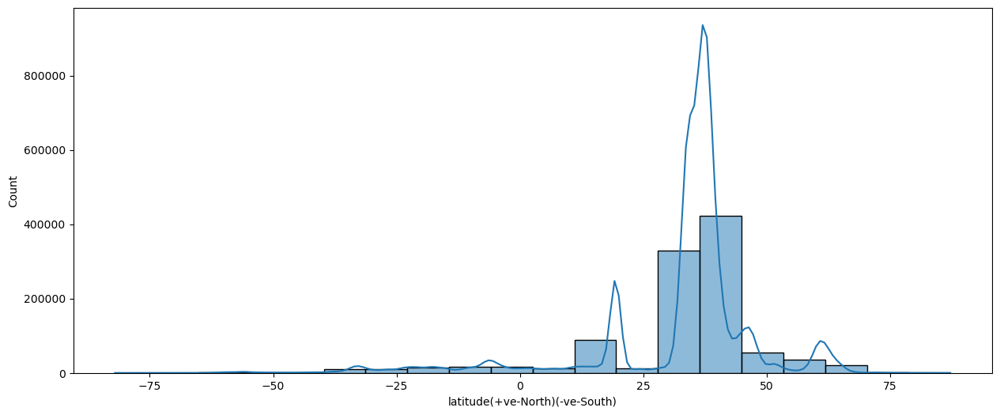

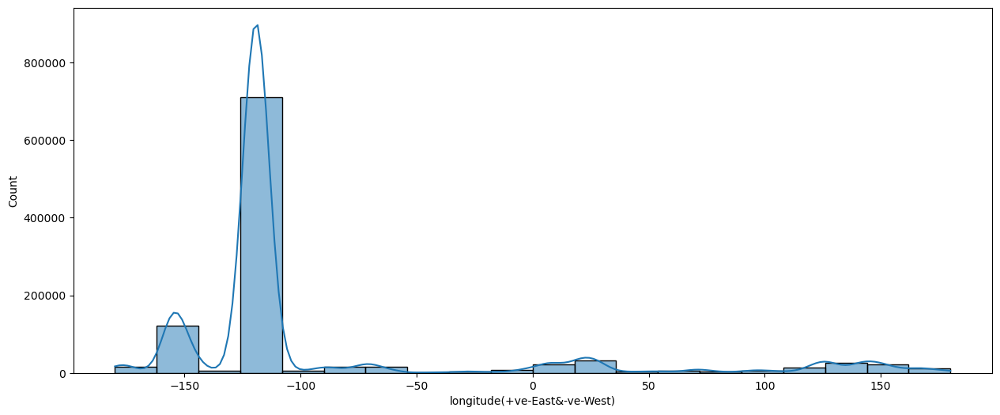

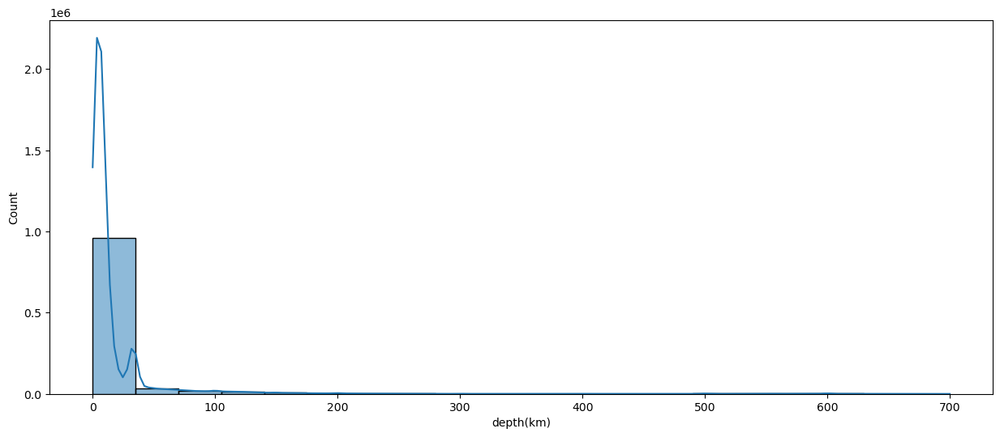

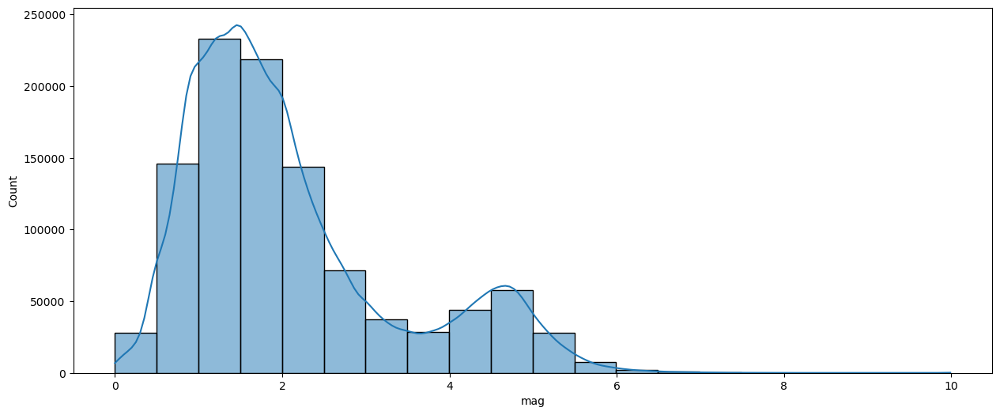

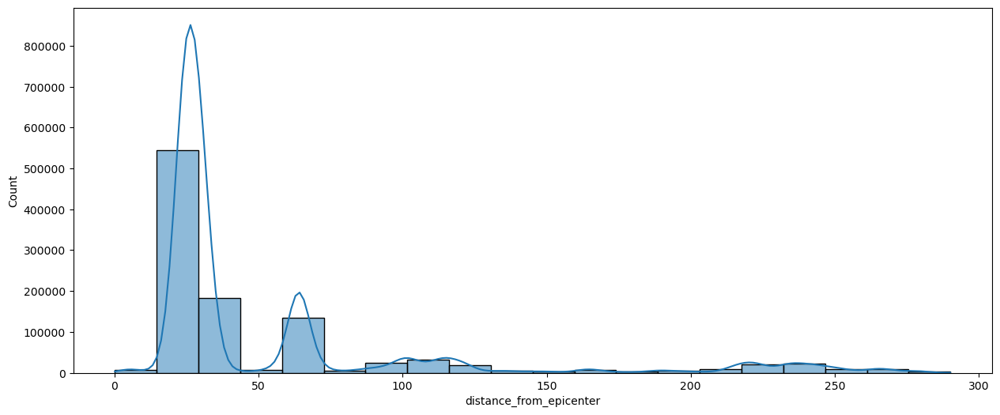

In [53]:
for i in continuous_columns:
    plt.figure(figsize=(15,6))
    sns.histplot(df[i], kde = True, bins = 20, palette = 'hls')
    plt.xticks(rotation = 0)
    plt.show() ## bins means number of bars kde=kernel density estimation plot
    #palette='hls': It specifies the color palette to be used for the plot. 'hls' likely stands for Hue, Lightness, Saturation, which represents a color scheme.

plt.figure(figsize=(15,6)): This line creates a new figure for plotting with a specified figsize. In this case, the figure will be 15 units wide and 6 units tall. This is useful for controlling the size of the plot.

sns.histplot(df[i], kde=True, bins=20, palette='hls'): This line uses Seaborn to create a histogram plot of the data in the DataFrame df for the column specified by i. Here's what each argument does:

df[i]: It selects the data from the column specified by i.
kde=True: It adds a kernel density estimate plot to the histogram, which provides a smoothed estimate of the data's underlying distribution.
bins=20: It specifies the number of bins or bars in the histogram. In this case, there will be 20 bins.
palette='hls': It specifies the color palette to be used for the plot. 'hls' likely stands for Hue, Lightness, Saturation, which represents a color scheme.
plt.xticks(rotation=0): This line sets the rotation of the x-axis tick labels to 0 degrees, meaning that the labels will be displayed horizontally. This is useful when you have long or overlapping tick labels.

plt.show(): This line displays the current figure. After this line, the code proceeds to the next iteration of the loop, creating a new figure for the next column in continuous_columns.

<Figure size 1500x600 with 0 Axes>

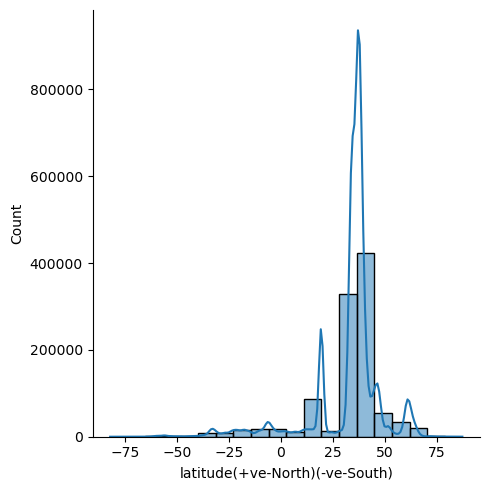

<Figure size 1500x600 with 0 Axes>

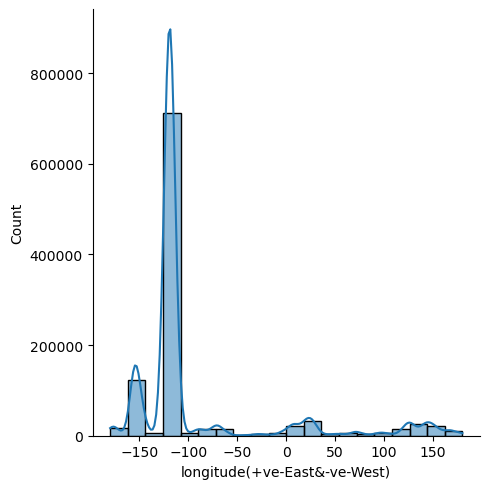

<Figure size 1500x600 with 0 Axes>

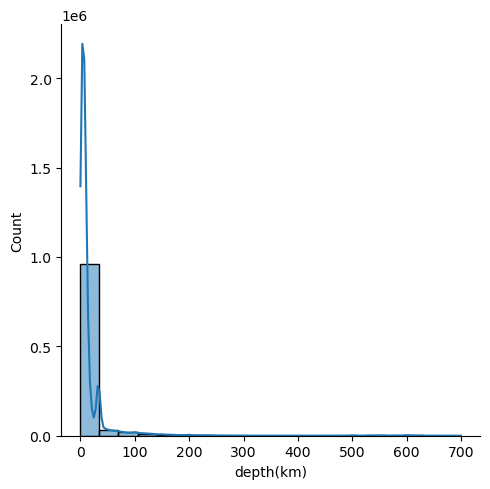

<Figure size 1500x600 with 0 Axes>

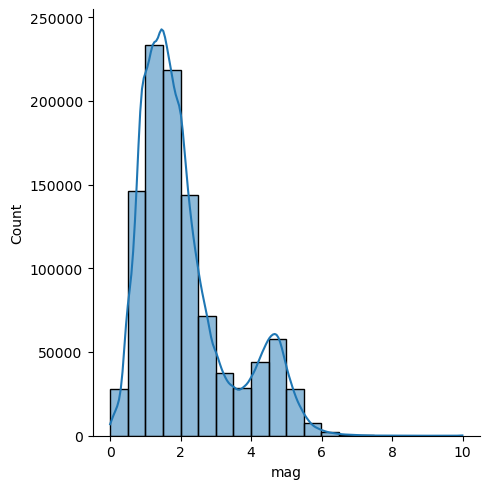

<Figure size 1500x600 with 0 Axes>

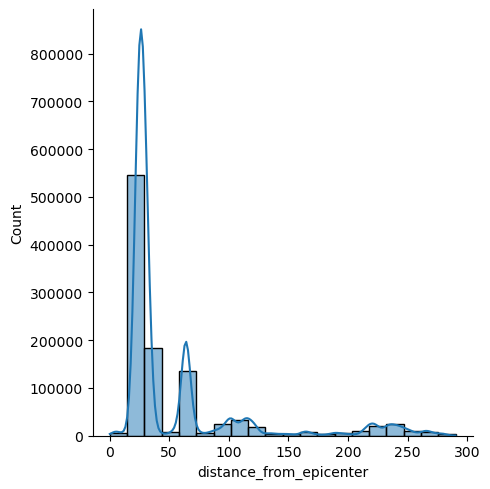

In [54]:
for i in continuous_columns:
    plt.figure(figsize=(15,6))
    sns.displot(df[i], kde = True, bins = 20)
    plt.xticks(rotation = 0)
    plt.show()

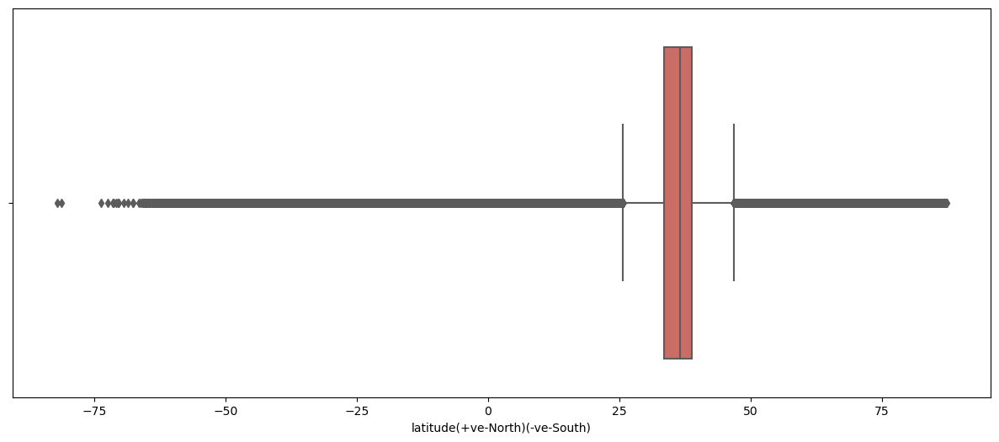

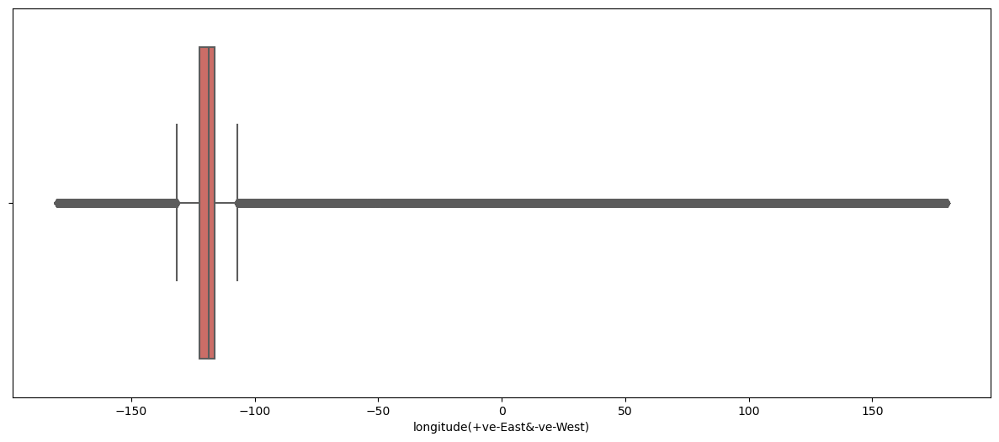

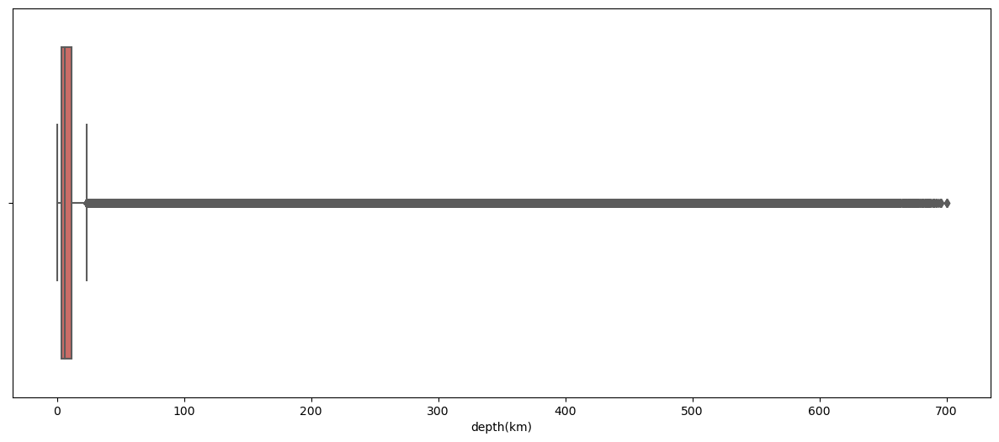

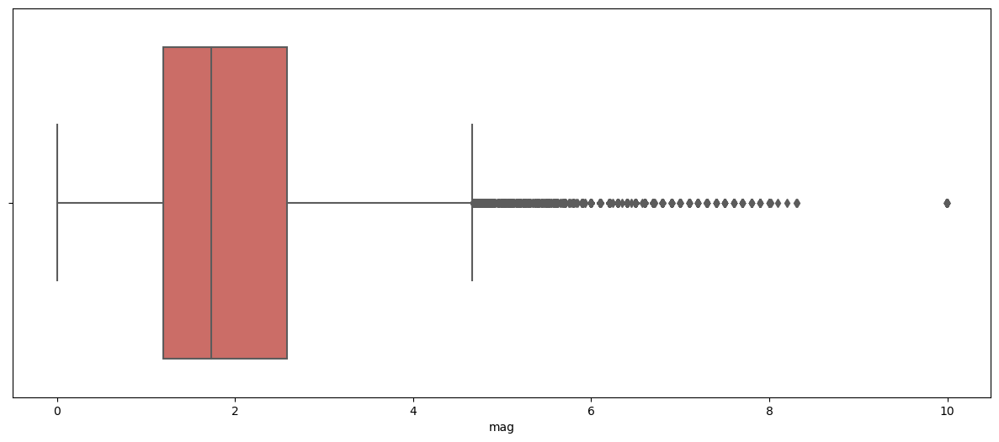

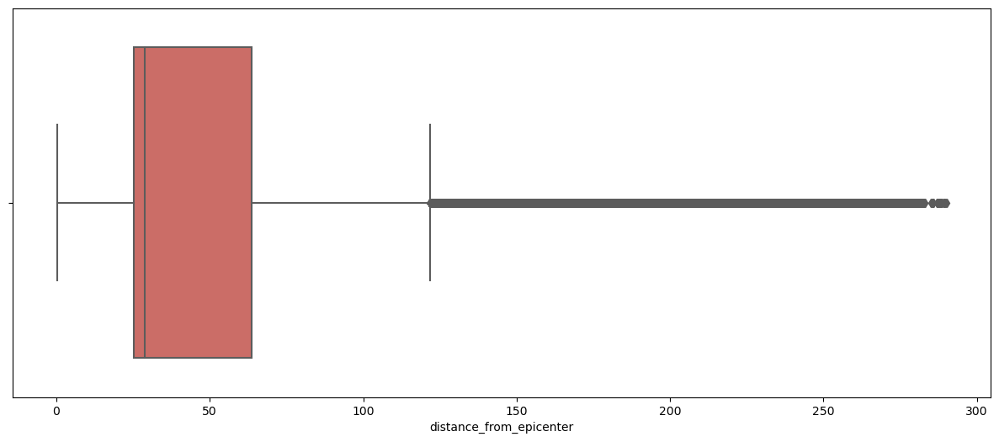

In [55]:
for i in continuous_columns:
    plt.figure(figsize=(15,6))
    sns.boxplot(df[i], data=df, palette='hls')
    plt.xticks(rotation = 0)
    plt.show()

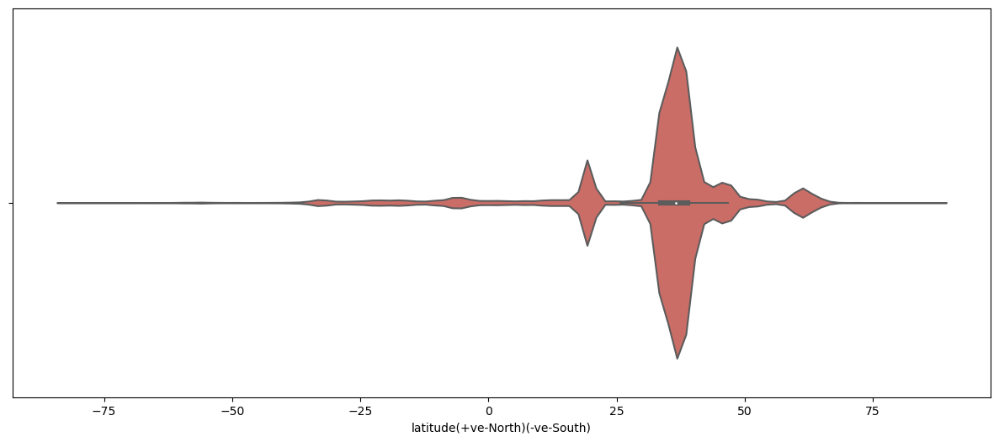

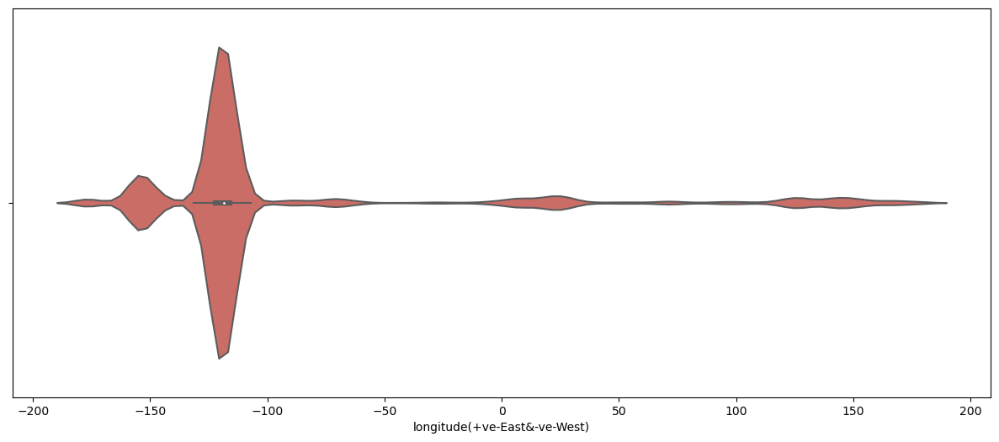

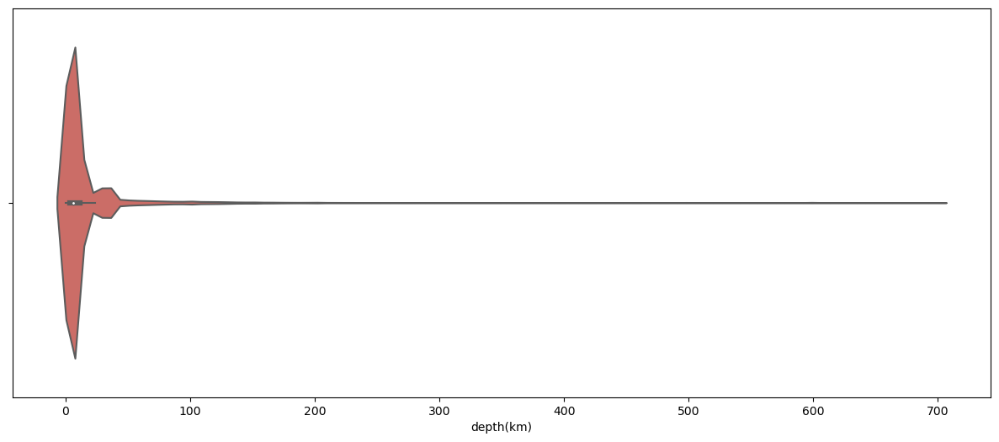

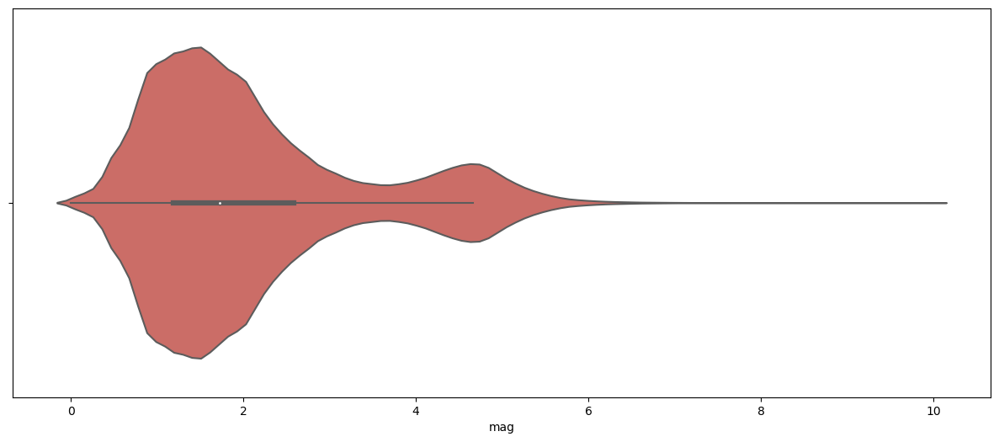

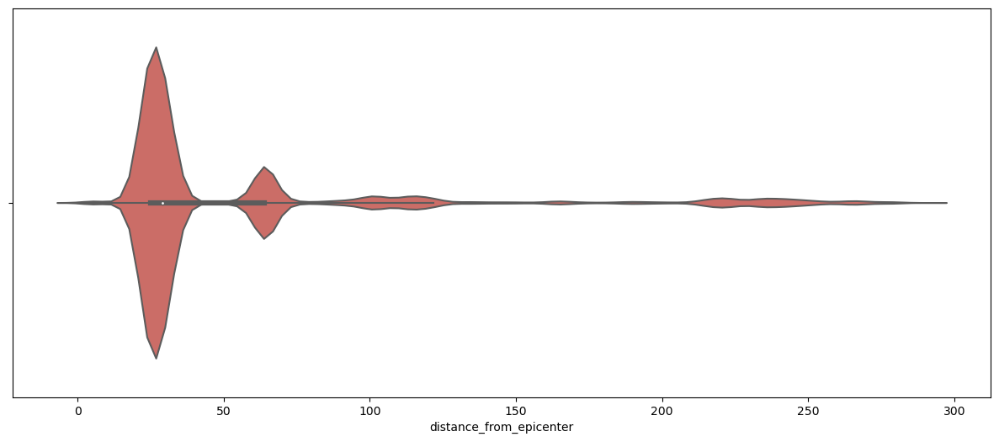

In [56]:
for i in continuous_columns:
    plt.figure(figsize=(15,6))
    sns.violinplot(df[i], data=df, palette='hls')
    plt.xticks(rotation = 0)
    plt.show()

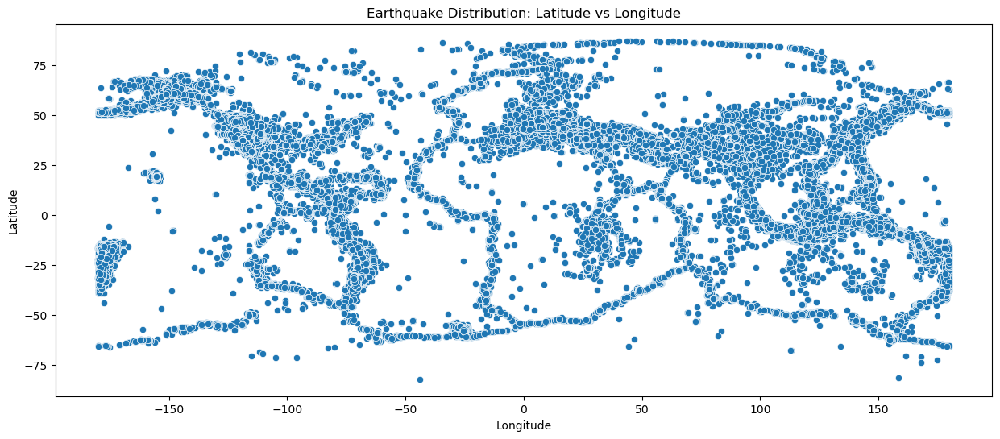

In [57]:
plt.figure(figsize=(15,6))
sns.scatterplot(x = df['longitude(+ve-East&-ve-West)'], y = df['latitude(+ve-North)(-ve-South)'], data = df, palette = 'hls')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Earthquake Distribution: Latitude vs Longitude')
plt.show()

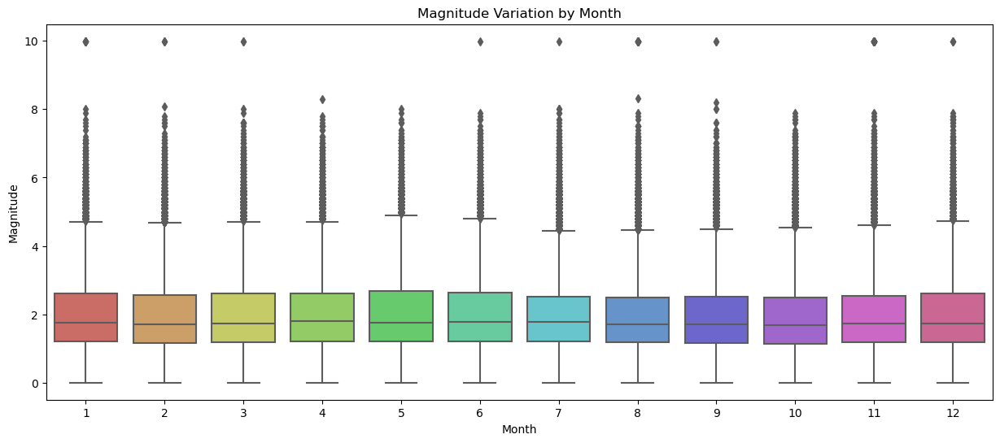

In [58]:
plt.figure(figsize=(15,6))
sns.boxplot(x = df['month'], y = df['mag'], data = df, palette = 'hls')
plt.xlabel('Month')
plt.ylabel('Magnitude')
plt.title('Magnitude Variation by Month')
plt.show()

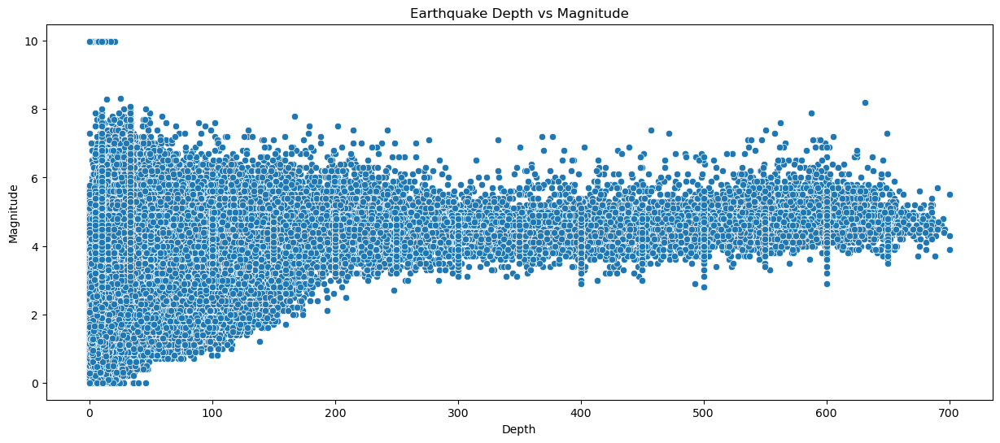

In [59]:
plt.figure(figsize=(15,6))
sns.scatterplot(x = df['depth(km)'], y = df['mag'], data = df, palette = 'hls')
plt.xlabel('Depth')
plt.ylabel('Magnitude')
plt.title('Earthquake Depth vs Magnitude')
plt.show()

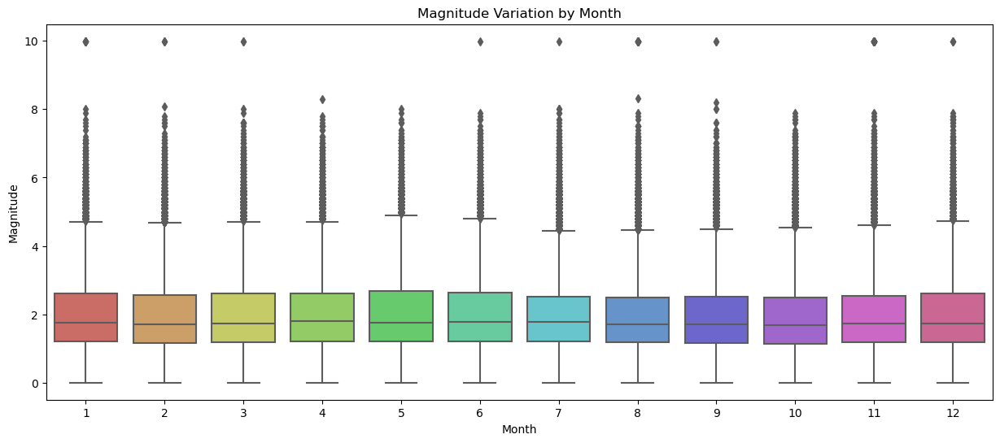

In [60]:
plt.figure(figsize=(15,6))
sns.boxplot(x = df['month'], y = df['mag'], data = df, palette = 'hls')
plt.xlabel('Month')
plt.ylabel('Magnitude')
plt.title('Magnitude Variation by Month')
plt.show()

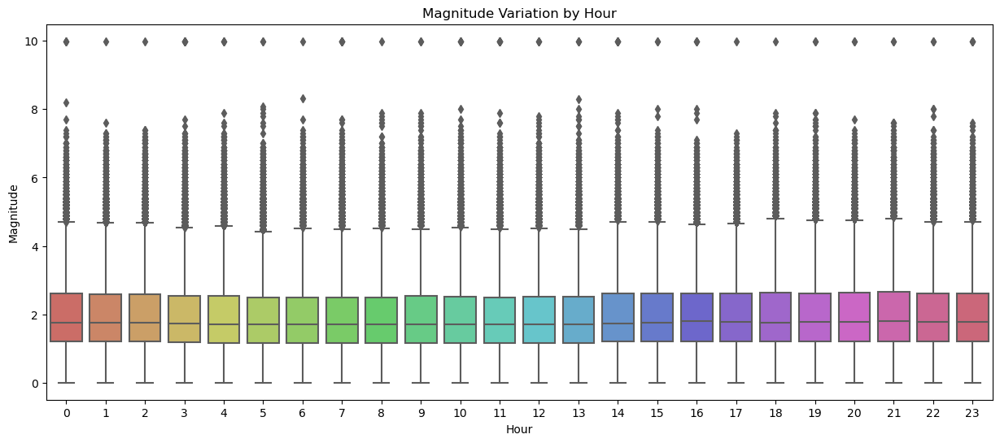

In [61]:
plt.figure(figsize=(15,6))
sns.boxplot(x = df['hour'], y = df['mag'], data = df, palette = 'hls')
plt.xlabel('Hour')
plt.ylabel('Magnitude')
plt.title('Magnitude Variation by Hour')
plt.show()

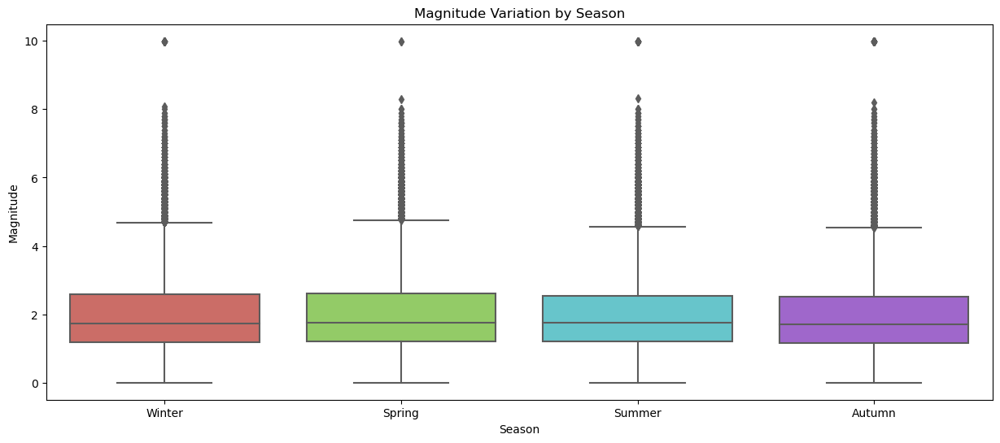

In [62]:
plt.figure(figsize=(15,6))
sns.boxplot(x = df['season'], y = df['mag'], data = df, palette = 'hls')
plt.xlabel('Season')
plt.ylabel('Magnitude')
plt.title('Magnitude Variation by Season')
plt.show()

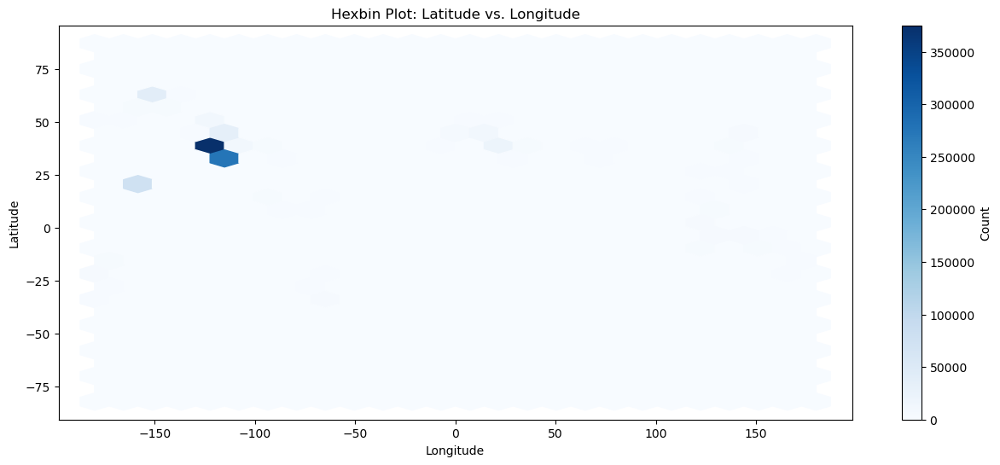

In [63]:
plt.figure(figsize=(15,6))
plt.hexbin(x = df['longitude(+ve-East&-ve-West)'], y = df['latitude(+ve-North)(-ve-South)'], gridsize=25, cmap='Blues')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Hexbin Plot: Latitude vs. Longitude')
plt.colorbar(label='Count')
plt.show()

Month wise average(mean) of magnitude 

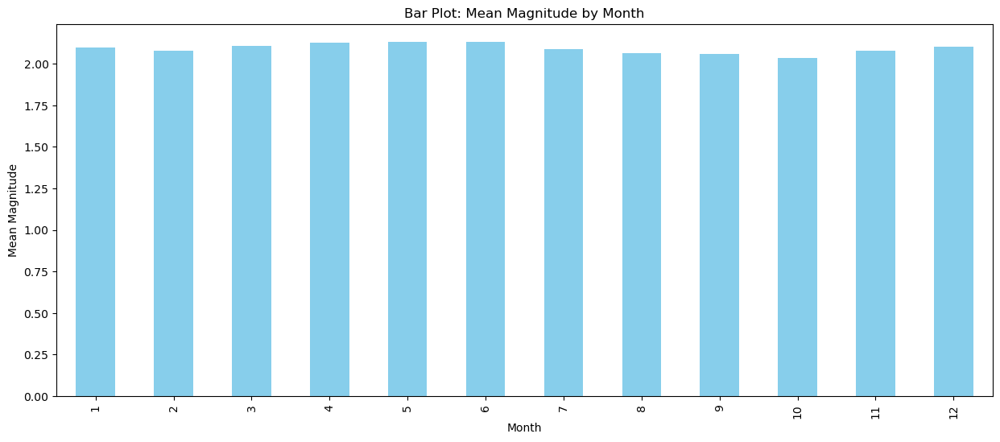

month
1     2.099276
2     2.078561
3     2.106541
4     2.125626
5     2.132353
6     2.131678
7     2.088851
8     2.066113
9     2.061605
10    2.036454
11    2.080163
12    2.101885
Name: mag, dtype: float64


In [64]:
mean_mag_by_month = df.groupby('month')['mag'].mean()
plt.figure(figsize=(15, 6))
mean_mag_by_month.plot(kind='bar', color='skyblue')
plt.xlabel('Month')
plt.ylabel('Mean Magnitude')
plt.title('Bar Plot: Mean Magnitude by Month')
plt.show()
print(mean_mag_by_month)

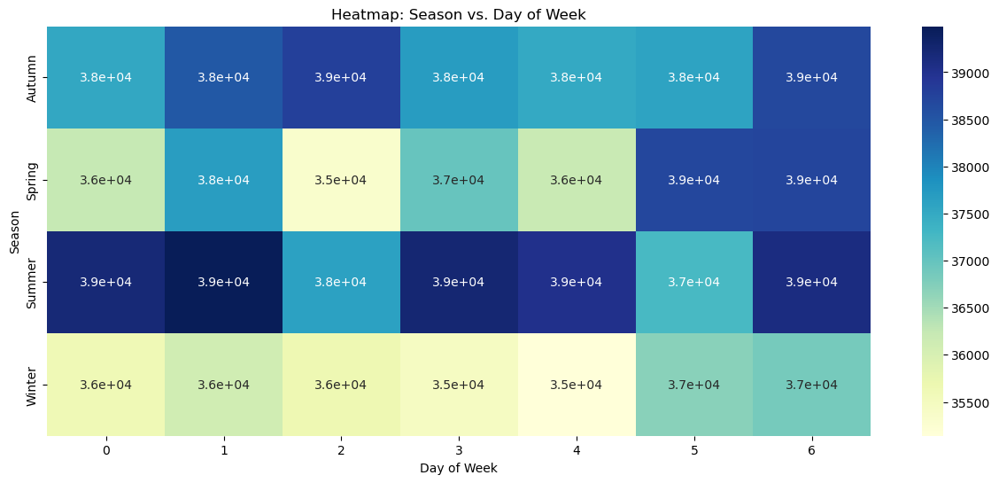

In [65]:
plt.figure(figsize=(15, 6))
sns.heatmap(pd.crosstab(df['season'], df['day_of_week']), annot=True, cmap='YlGnBu')
plt.xlabel('Day of Week')
plt.ylabel('Season')
plt.title('Heatmap: Season vs. Day of Week')
plt.show()

Line Plot: Magnitude Trends over Days of the Year-------> if there is multiple earthquake at diffrent location or at diff hour thats why 

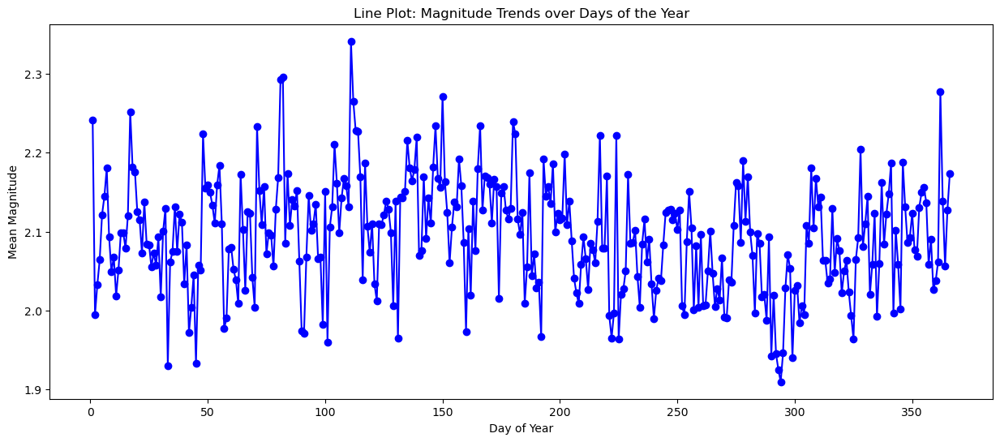

day_of_year
1      2.241391
2      1.994653
3      2.033098
4      2.064183
5      2.121399
         ...   
362    2.277566
363    2.138479
364    2.056426
365    2.127148
366    2.173262
Name: mag, Length: 366, dtype: float64


In [66]:
plt.figure(figsize=(15, 6))
plt.plot(df.groupby('day_of_year')['mag'].mean(), marker='o', color='b')
plt.xlabel('Day of Year')
plt.ylabel('Mean Magnitude')
plt.title('Line Plot: Magnitude Trends over Days of the Year')
plt.show()
print(df.groupby('day_of_year')['mag'].mean())

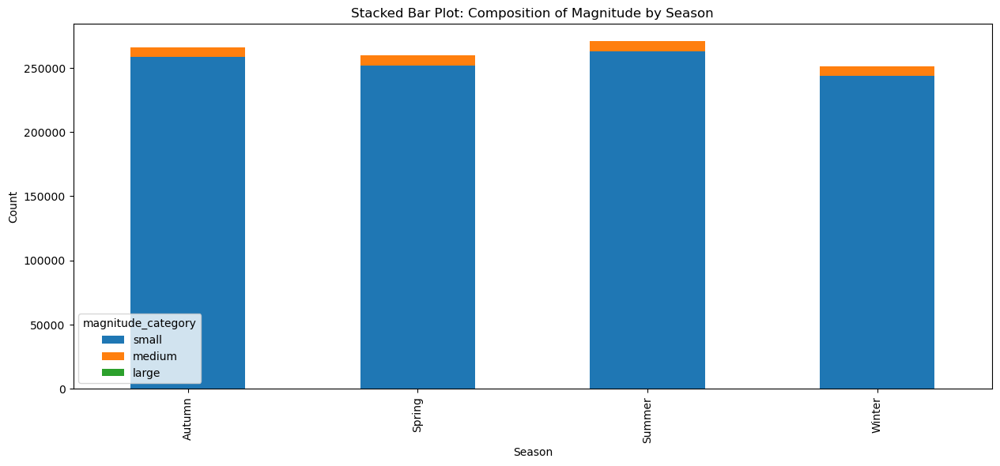

In [67]:
season_mag_composition = df.groupby(['season', 'magnitude_category']).size().unstack()
season_mag_composition.plot(kind='bar', stacked=True, figsize=(15, 6))
plt.xlabel('Season')
plt.ylabel('Count')
plt.title('Stacked Bar Plot: Composition of Magnitude by Season')
plt.show()

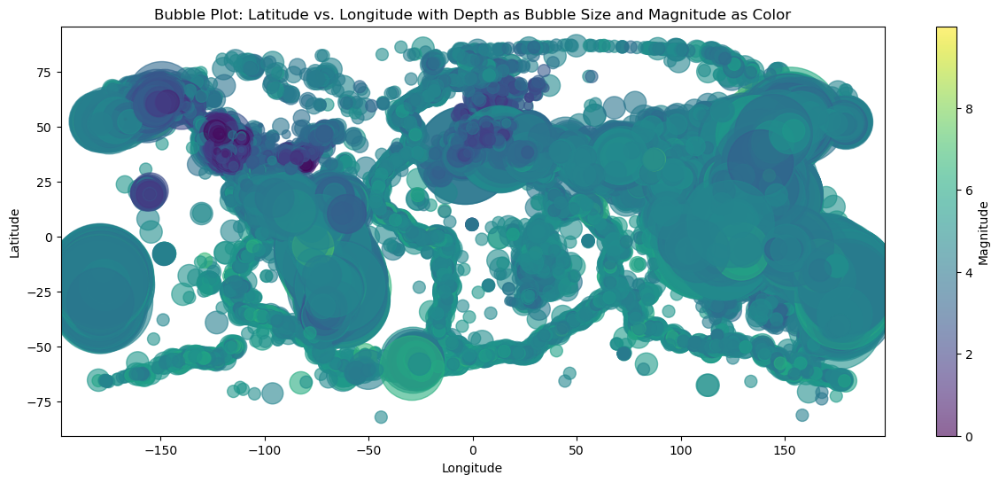

In [68]:
plt.figure(figsize=(15, 6))
plt.scatter(df['longitude(+ve-East&-ve-West)'], df['latitude(+ve-North)(-ve-South)'], c=df['mag'], cmap='viridis', alpha=0.6, s=df['depth(km)']*10)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Bubble Plot: Latitude vs. Longitude with Depth as Bubble Size and Magnitude as Color')
plt.colorbar(label='Magnitude')
plt.show()

In [69]:
correlation_matrix = df.corr()

In [70]:
correlation_matrix

,latitude(+ve-North)(-ve-South),longitude(+ve-East&-ve-West),depth(km),mag,hour,day,month,year,day_of_week,is_weekend,distance_from_epicenter,day_of_year
latitude(+ve-North)(-ve-South),1.000000,-0.331772,-0.352418,-0.498085,-0.002232,0.003491,-0.001535,0.105077,-0.000633,-0.000740,-0.419312,-0.001243
longitude(+ve-East&-ve-West),-0.331772,1.000000,0.270744,0.644991,0.014426,0.003384,-0.005124,0.016264,0.001593,0.001781,0.899848,-0.004893
depth(km),-0.352418,0.270744,1.000000,0.421881,0.005581,-0.001705,-0.002335,-0.020326,-0.000433,0.000178,0.401575,-0.002522
mag,-0.498085,0.644991,0.421881,1.000000,0.014649,-0.000158,-0.009993,-0.121625,-0.003930,-0.002826,0.719173,-0.010009
hour,-0.002232,0.014426,0.005581,0.014649,1.000000,0.001958,0.001079,0.003074,0.004740,0.005836,0.016960,0.001249
day,0.003491,0.003384,-0.001705,-0.000158,0.001958,1.000000,0.021720,-0.000104,0.001877,0.003750,-0.004821,0.105597
month,-0.001535,-0.005124,-0.002335,-0.009993,0.001079,0.021720,1.000000,-0.019811,-0.009268,-0.011971,-0.007561,0.996443
year,0.105077,0.016264,-0.020326,-0.121625,0.003074,-0.000104,-0.019811,1.000000,0.001946,0.000162,-0.028077,-0.019429
day_of_week,-0.000633,0.001593,-0.000433,-0.003930,0.004740,0.001877,-0.009268,0.001946,1.000000,0.793534,0.003249,-0.009062
is_weekend,-0.000740,0.001781,0.000178,-0.002826,0.005836,0.003750,-0.011971,0.000162,0.793534,1.000000,0.002239,-0.011580


In [71]:
from mpl_toolkits.mplot3d import Axes3D

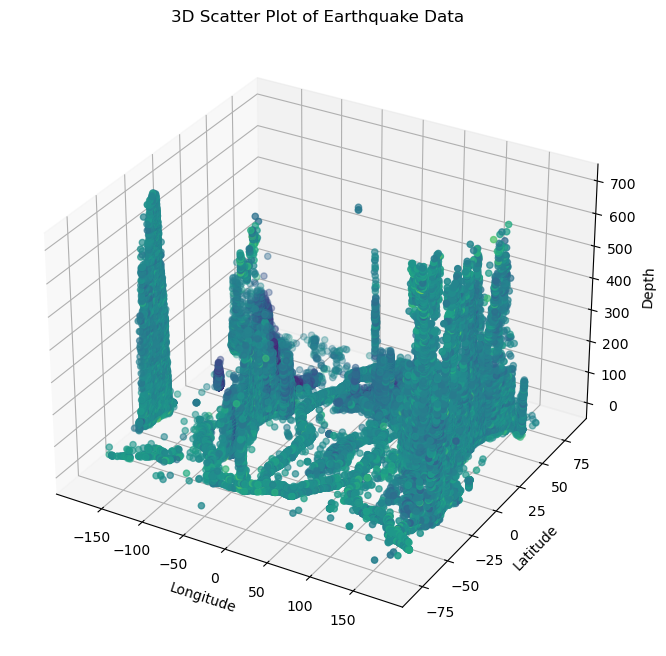

In [72]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df['longitude(+ve-East&-ve-West)'], df['latitude(+ve-North)(-ve-South)'], df['depth(km)'], c=df['mag'], cmap='viridis')

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Depth')
ax.set_title('3D Scatter Plot of Earthquake Data')

plt.show()

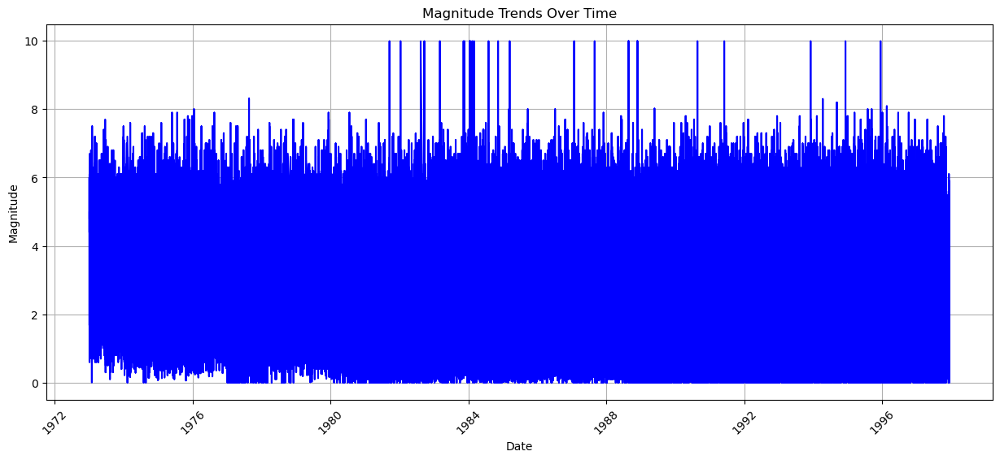

In [73]:
plt.figure(figsize=(15, 6))
plt.plot(df['date'], df['mag'], color='blue')
plt.xlabel('Date')
plt.ylabel('Magnitude')
plt.title('Magnitude Trends Over Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

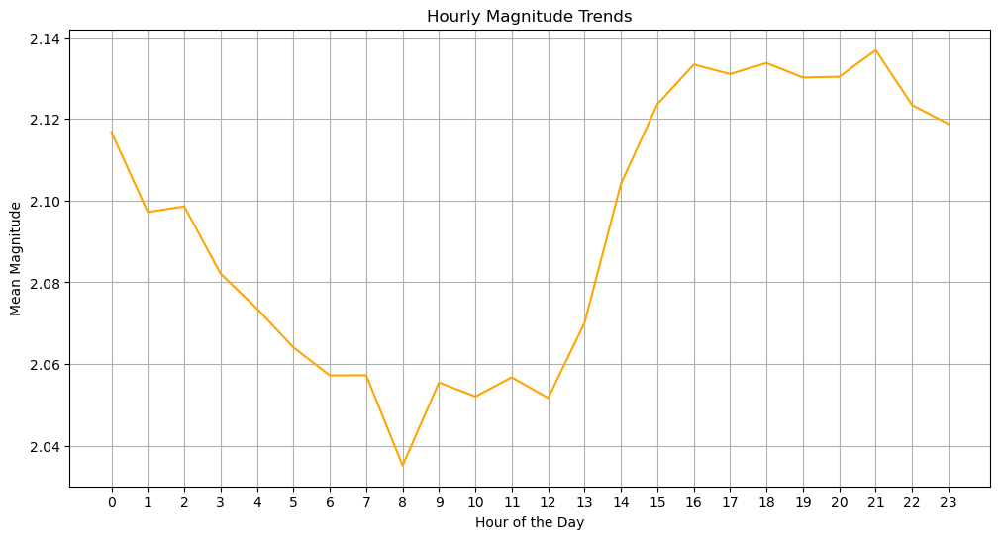

In [74]:
hourly_mean_magnitude = df.groupby('hour')['mag'].mean()

plt.figure(figsize=(12, 6))
plt.plot(hourly_mean_magnitude.index, hourly_mean_magnitude.values, color='orange')
plt.xlabel('Hour of the Day')
plt.ylabel('Mean Magnitude')
plt.title('Hourly Magnitude Trends')
plt.xticks(range(24))
plt.grid(True)
plt.show()

In [75]:
fig = px.line(hourly_mean_magnitude, title='Hourly Magnitude Trends',
              labels={'hour': 'Hour of the Day', 'mag': 'Mean Magnitude'},
              line_shape='linear', render_mode='svg', width=800, height=400)
fig.update_traces(line=dict(color='orange'))
fig.show()

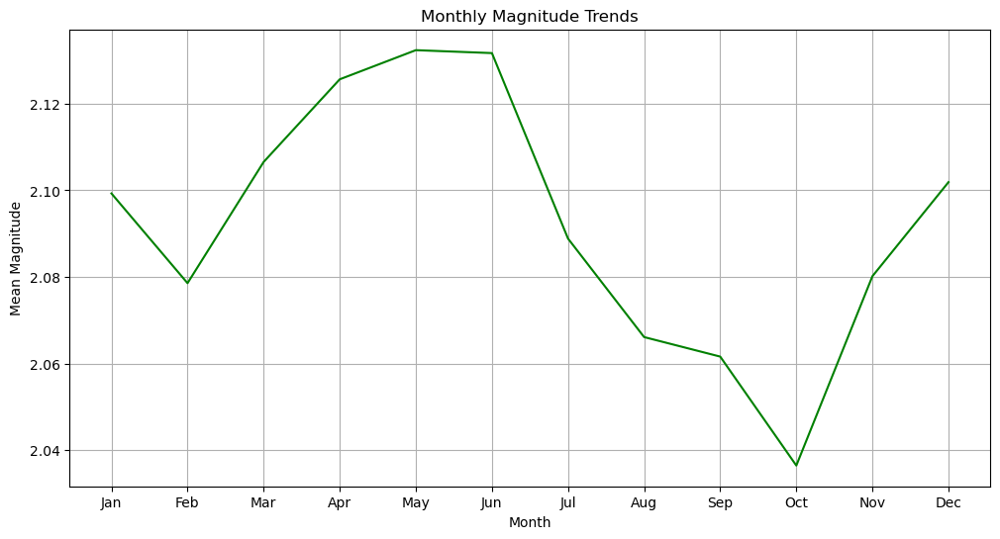

In [76]:
monthly_mean_magnitude = df.groupby('month')['mag'].mean()

# Plotting monthly magnitude trends
plt.figure(figsize=(12, 6))
plt.plot(monthly_mean_magnitude.index, monthly_mean_magnitude.values, color='green')
plt.xlabel('Month')
plt.ylabel('Mean Magnitude')
plt.title('Monthly Magnitude Trends')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.show()

In [77]:
monthly_mean_magnitude = df.groupby('month')['mag'].mean().reset_index()
fig = px.line(monthly_mean_magnitude, x='month', y='mag',
              labels={'month': 'Month', 'mag': 'Mean Magnitude'},
              title='Monthly Magnitude Trends',
              line_shape='linear', render_mode='svg', width=800, height=400)
fig.update_traces(line=dict(color='green'))
fig.update_xaxes(tickvals=list(range(1, 13)), ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
fig.show()

In [78]:
unique_years = df['date'].dt.year.unique()

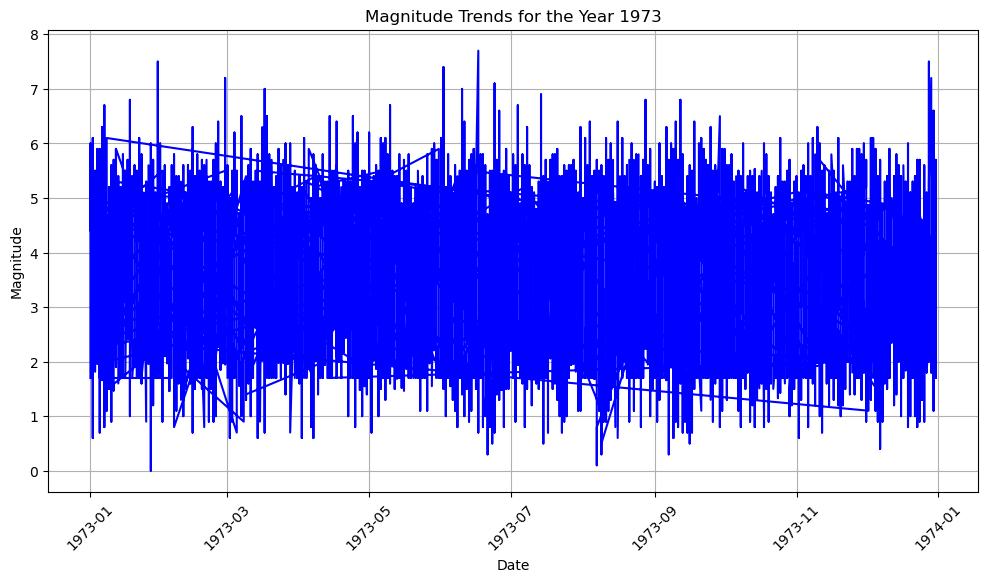

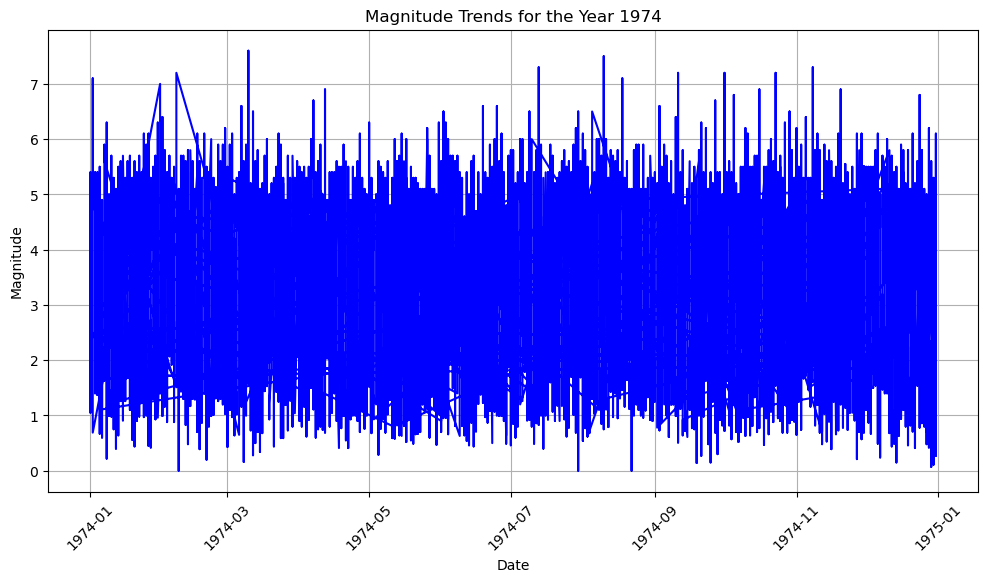

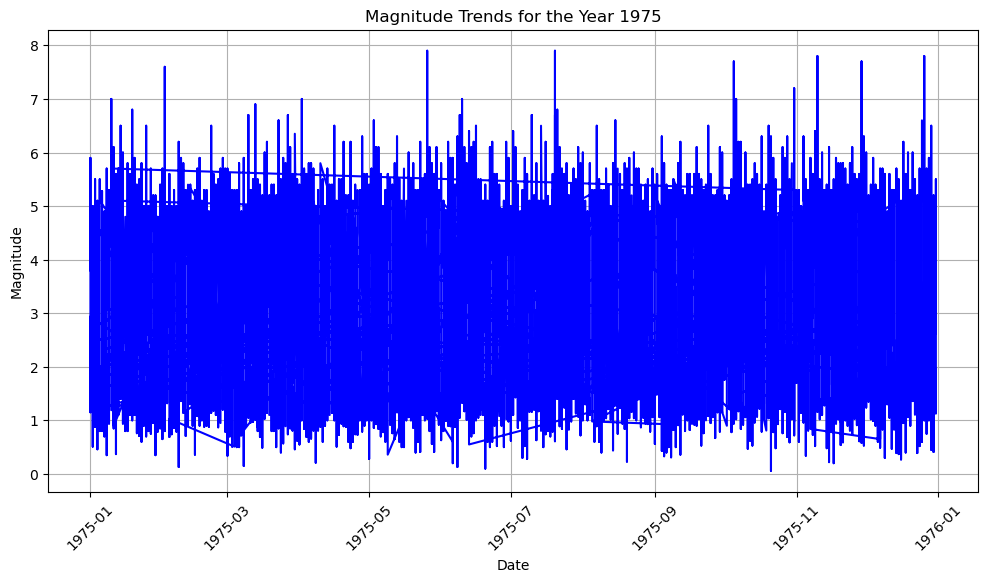

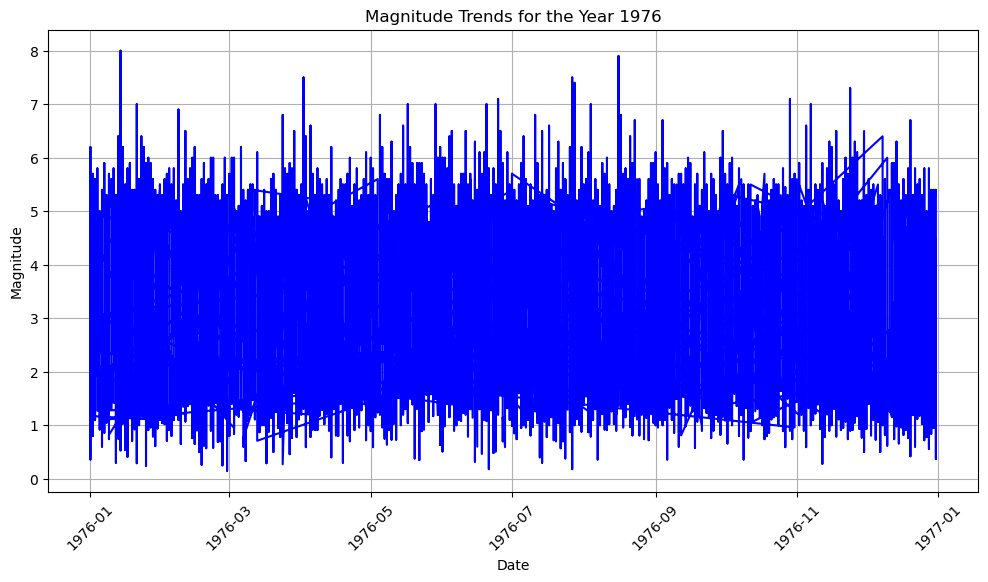

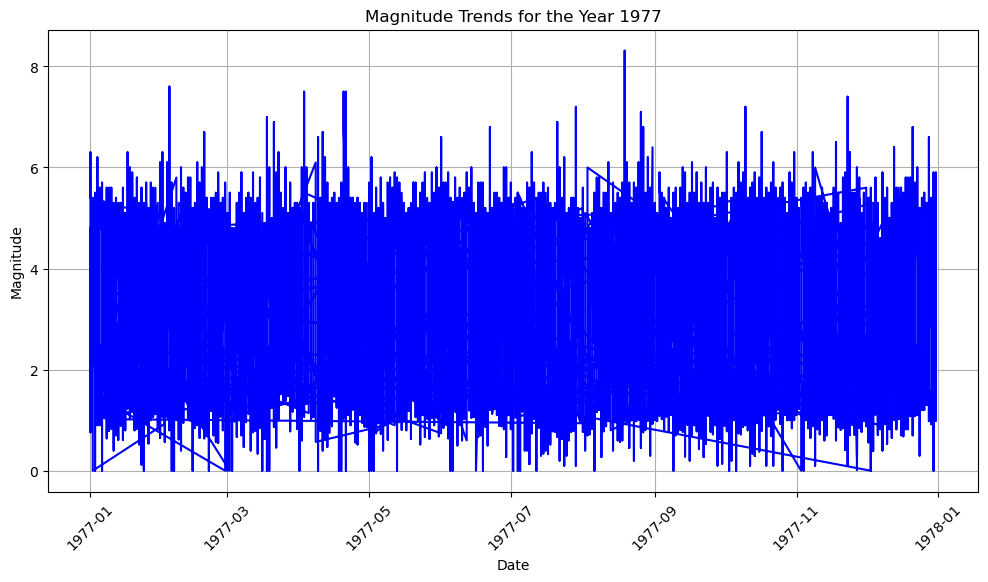

...

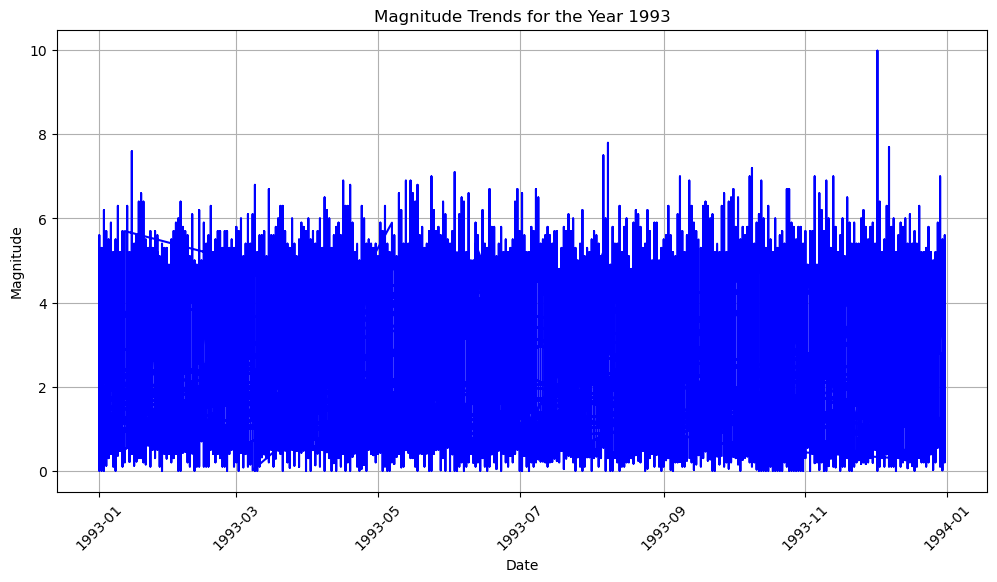

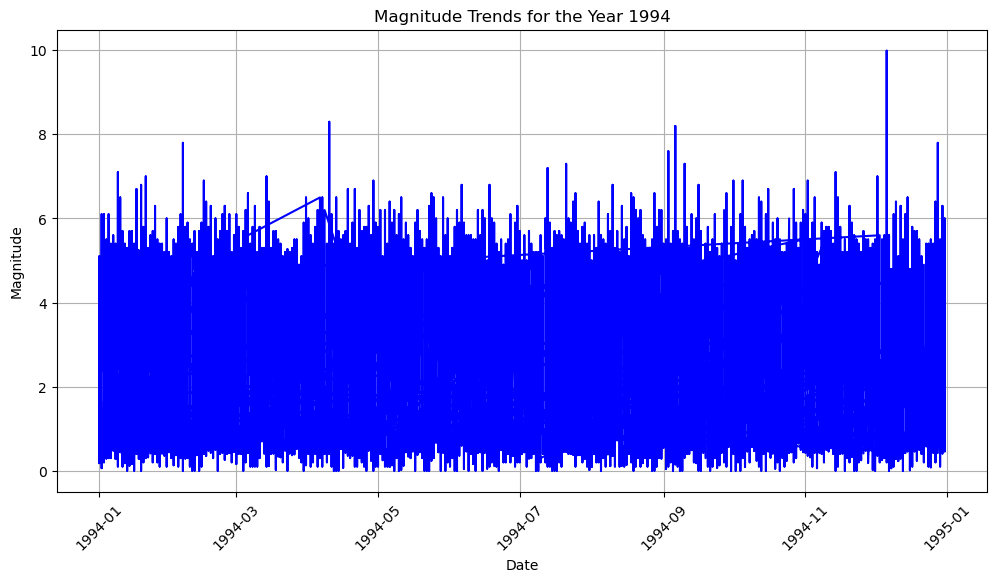

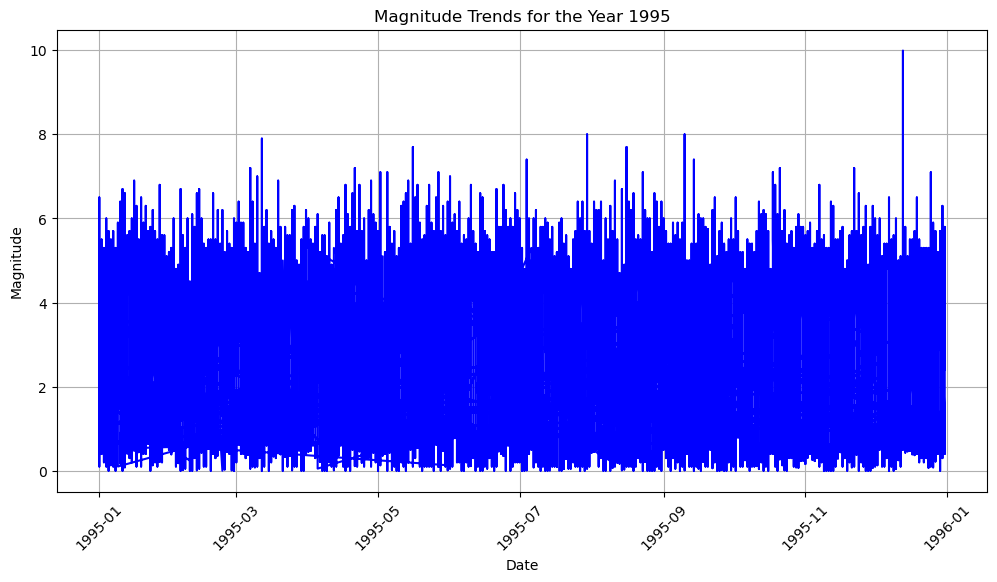

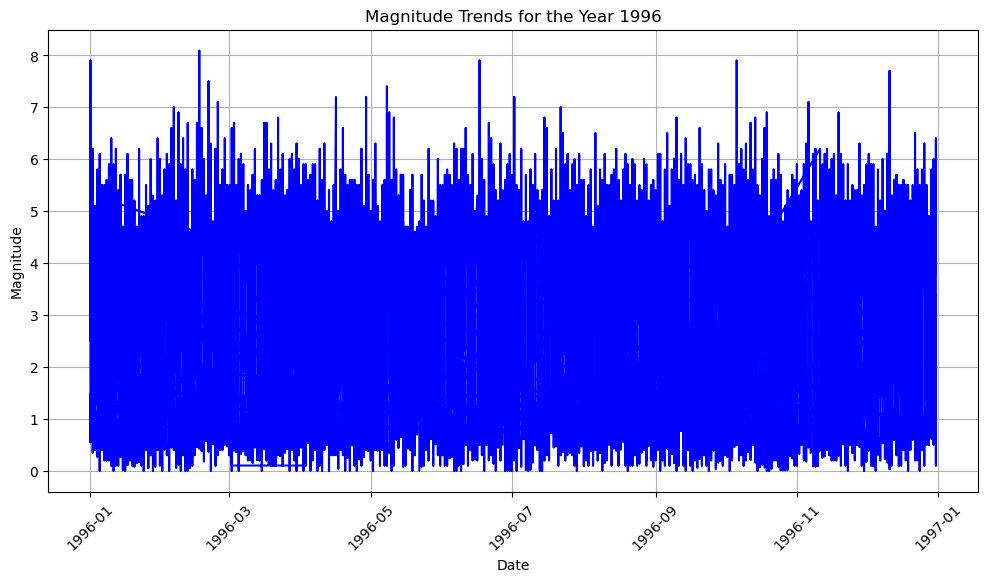

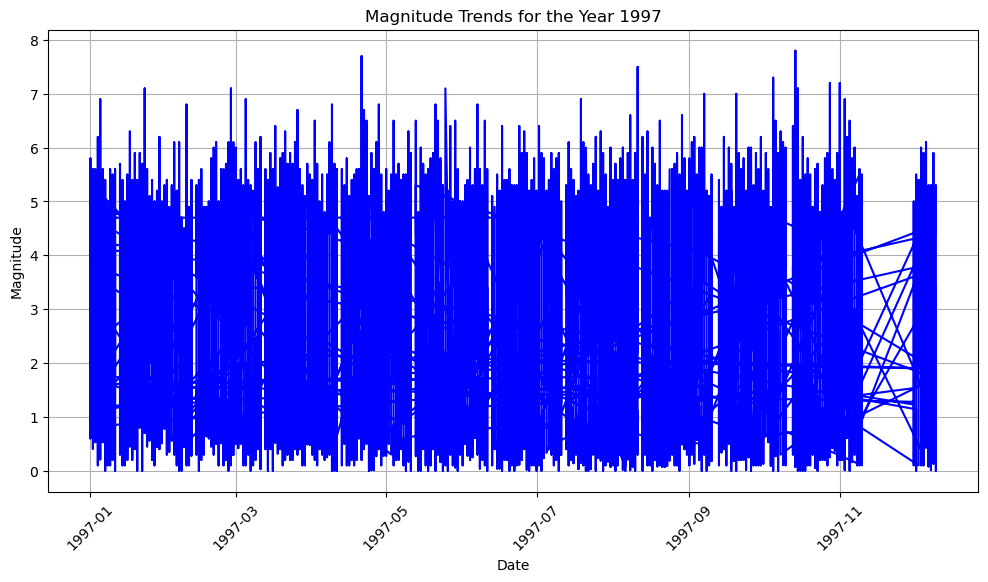

In [79]:
for year in unique_years:
    year_data = df[df['date'].dt.year == year]
    
    plt.figure(figsize=(12, 6))
    plt.plot(year_data['date'], year_data['mag'], color='blue')
    plt.xlabel('Date')
    plt.ylabel('Magnitude')
    plt.title(f'Magnitude Trends for the Year {year}')
    plt.xticks(rotation=45) 
    plt.grid(True)
    plt.show()

In [80]:
max_mag_data = df.loc[df['mag'].idxmax()]
max_mag_date = max_mag_data['date']
max_mag = max_mag_data['mag']

min_mag_data = df.loc[df['mag'].idxmin()]
min_mag_date = min_mag_data['date']
min_mag = min_mag_data['mag']

print(f'Date with Maximum Magnitude: {max_mag_date}, Magnitude: {max_mag:.2f}')
print(f'Date with Minimum Magnitude: {min_mag_date}, Magnitude: {min_mag:.2f}')

Date with Maximum Magnitude: 1981-09-15 00:00:00, Magnitude: 9.99
Date with Minimum Magnitude: 1973-01-27 00:00:00, Magnitude: 0.00


In [81]:
for year in unique_years:
    year_data = df[df['date'].dt.year == year]
    
    max_mag_date = year_data.loc[year_data['mag'].idxmax(), 'date']
    min_mag_date = year_data.loc[year_data['mag'].idxmin(), 'date']
    max_mag = year_data['mag'].max()
    min_mag = year_data['mag'].min()
    
    print(f'Year: {year}')
    print(f'Max Magnitude: {max_mag:.2f}, Date: {max_mag_date}')
    print(f'Min Magnitude: {min_mag:.2f}, Date: {min_mag_date}\n')

Year: 1973
Max Magnitude: 7.70, Date: 1973-06-17 00:00:00
Min Magnitude: 0.00, Date: 1973-01-27 00:00:00

Year: 1974
Max Magnitude: 7.60, Date: 1974-03-10 00:00:00
Min Magnitude: 0.00, Date: 1974-07-30 00:00:00

Year: 1975
Max Magnitude: 7.90, Date: 1975-05-26 00:00:00
Min Magnitude: 0.06, Date: 1975-10-21 00:00:00

Year: 1976
Max Magnitude: 8.00, Date: 1976-01-14 00:00:00
Min Magnitude: 0.15, Date: 1976-02-29 00:00:00

Year: 1977
Max Magnitude: 8.31, Date: 1977-08-19 00:00:00
Min Magnitude: 0.00, Date: 1977-03-01 00:00:00

Year: 1978
Max Magnitude: 7.70, Date: 1978-12-06 00:00:00
Min Magnitude: 0.00, Date: 1978-08-01 00:00:00

Year: 1979
Max Magnitude: 7.90, Date: 1979-12-09 00:00:00
Min Magnitude: 0.01, Date: 1979-05-30 00:00:00

Year: 1980
Max Magnitude: 7.90, Date: 1980-07-17 00:00:00
Min Magnitude: 0.00, Date: 1980-05-19 00:00:00

Year: 1981
Max Magnitude: 9.99, Date: 1981-09-15 00:00:00
Min Magnitude: 0.00, Date: 1981-02-14 00:00:00

Year: 1982
Max Magnitude: 9.99, Date: 1982-09-

In [82]:
for year in unique_years:
    year_data = df[df['date'].dt.year == year]
    
    unique_months = year_data['date'].dt.month.unique()
    
    print(f'Year: {year}')
    
    for month in unique_months:
        month_data = year_data[year_data['date'].dt.month == month]
        max_mag_date = month_data.loc[month_data['mag'].idxmax(), 'date']
        min_mag_date = month_data.loc[month_data['mag'].idxmin(), 'date']
        max_mag = month_data['mag'].max()
        min_mag = month_data['mag'].min()
        
        print(f'\tMonth: {month}')
        print(f'\t\tMax Magnitude: {max_mag:.2f}, Date: {max_mag_date}')
        print(f'\t\tMin Magnitude: {min_mag:.2f}, Date: {min_mag_date}')
    
    print()  

Year: 1973
	Month: 1
		Max Magnitude: 7.50, Date: 1973-01-30 00:00:00
		Min Magnitude: 0.00, Date: 1973-01-27 00:00:00
	Month: 2
		Max Magnitude: 7.20, Date: 1973-02-28 00:00:00
		Min Magnitude: 0.70, Date: 1973-02-14 00:00:00
	Month: 3
		Max Magnitude: 7.00, Date: 1973-03-17 00:00:00
		Min Magnitude: 0.60, Date: 1973-03-02 00:00:00
	Month: 4
		Max Magnitude: 6.50, Date: 1973-04-14 00:00:00
		Min Magnitude: 0.60, Date: 1973-04-02 00:00:00
	Month: 5
		Max Magnitude: 6.70, Date: 1973-05-10 00:00:00
		Min Magnitude: 0.70, Date: 1973-05-02 00:00:00
	Month: 6
		Max Magnitude: 7.70, Date: 1973-06-17 00:00:00
		Min Magnitude: 0.30, Date: 1973-06-21 00:00:00
	Month: 7
		Max Magnitude: 6.90, Date: 1973-07-14 00:00:00
		Min Magnitude: 0.50, Date: 1973-07-15 00:00:00
	Month: 8
		Max Magnitude: 6.80, Date: 1973-08-28 00:00:00
		Min Magnitude: 0.10, Date: 1973-08-07 00:00:00
	Month: 9
		Max Magnitude: 6.80, Date: 1973-09-12 00:00:00
		Min Magnitude: 0.30, Date: 1973-09-07 00:00:00
	Month: 10
		Max 

In [83]:
for year in unique_years:
    year_data = df[df['date'].dt.year == year]
    unique_months = year_data['date'].dt.month.unique()
    
    print(f'Year: {year}')
    
    for month in unique_months:
        month_data = year_data[year_data['date'].dt.month == month]
        max_data = month_data.loc[month_data['mag'].idxmax()]
        min_data = month_data.loc[month_data['mag'].idxmin()]
        
        print(f'\tMonth: {month}')
        print(f'\t\tMaximum Magnitude: {max_data["mag"]:.2f}')
        print(f'\t\t\tDate: {max_data["date"]}, Latitude: {max_data["latitude(+ve-North)(-ve-South)"]}, Longitude: {max_data["longitude(+ve-East&-ve-West)"]}, Depth: {max_data["depth(km)"]}')
        print(f'\t\tMinimum Magnitude: {min_data["mag"]:.2f}')
        print(f'\t\t\tDate: {min_data["date"]}, Latitude: {min_data["latitude(+ve-North)(-ve-South)"]}, Longitude: {min_data["longitude(+ve-East&-ve-West)"]}, Depth: {min_data["depth(km)"]}')
    
    print() 

Year: 1973
	Month: 1
		Maximum Magnitude: 7.50
			Date: 1973-01-30 00:00:00, Latitude: 18.481, Longitude: -102.996, Depth: 43.0
		Minimum Magnitude: 0.00
			Date: 1973-01-27 00:00:00, Latitude: 34.468666, Longitude: -118.41217, Depth: 10.68
	Month: 2
		Maximum Magnitude: 7.20
			Date: 1973-02-28 00:00:00, Latitude: 50.486, Longitude: 156.584, Depth: 27.0
		Minimum Magnitude: 0.70
			Date: 1973-02-14 00:00:00, Latitude: 46.654667, Longitude: -119.12417, Depth: 0.0
	Month: 3
		Maximum Magnitude: 7.00
			Date: 1973-03-17 00:00:00, Latitude: 13.372, Longitude: 122.787, Depth: 33.0
		Minimum Magnitude: 0.60
			Date: 1973-03-02 00:00:00, Latitude: 46.846832, Longitude: -119.305, Depth: 0.116
	Month: 4
		Maximum Magnitude: 6.50
			Date: 1973-04-14 00:00:00, Latitude: 10.679, Longitude: -84.759, Depth: 33.0
		Minimum Magnitude: 0.60
			Date: 1973-04-02 00:00:00, Latitude: 46.662167, Longitude: -119.16433, Depth: 0.0
	Month: 5
		Maximum Magnitude: 6.70
			Date: 1973-05-10 00:00:00, Latitude: -3

In [84]:
max_magnitudes = []
min_magnitudes = []
years = []

for year in unique_years:
    year_data = df[df['date'].dt.year == year]
    max_mag_date = year_data.loc[year_data['mag'].idxmax(), 'date']
    min_mag_date = year_data.loc[year_data['mag'].idxmin(), 'date']
    max_mag = year_data['mag'].max()
    min_mag = year_data['mag'].min()
    max_magnitudes.append(max_mag)
    min_magnitudes.append(min_mag)
    years.append(year)

fig = go.Figure()

fig.add_trace(go.Scatter(x=years, y=max_magnitudes, mode='lines+markers', name='Max Magnitude'))
fig.add_trace(go.Scatter(x=years, y=min_magnitudes, mode='lines+markers', name='Min Magnitude'))

fig.update_layout(
    title='Maximum and Minimum Magnitudes for Each Year',
    xaxis_title='Year',
    yaxis_title='Magnitude',
    legend=dict(x=0.02, y=0.98),
)

fig.show()

In [85]:
for year in unique_years:
    year_data = df[df['date'].dt.year == year]
    unique_months = year_data['date'].dt.month.unique()
    fig = go.Figure()
    for month in unique_months:
        month_data = year_data[year_data['date'].dt.month == month]
        max_mag_date = month_data.loc[month_data['mag'].idxmax(), 'date']
        min_mag_date = month_data.loc[month_data['mag'].idxmin(), 'date']
        max_mag = month_data['mag'].max()
        min_mag = month_data['mag'].min()
        fig.add_trace(go.Scatter(x=[max_mag_date], y=[max_mag],
                                 mode='markers', name=f'Max Magnitude - Month {month}'))
        fig.add_trace(go.Scatter(x=[min_mag_date], y=[min_mag],
                                 mode='markers', name=f'Min Magnitude - Month {month}'))
    fig.update_layout(
        title=f'Max and Min Magnitude for Each Month - Year {year}',
        xaxis_title='Date',
        yaxis_title='Magnitude',
    )
    fig.show()

In [87]:
df1 = df.copy()

In [88]:
df1 = pd.get_dummies(df1, columns=['season'], drop_first=True, prefix='season')

In [89]:
df1 = pd.get_dummies(df1, columns=['magnitude_category'], drop_first=True, prefix='magnitude')

In [90]:
df1.columns

Index(['latitude(+ve-North)(-ve-South)', 'longitude(+ve-East&-ve-West)',
       'depth(km)', 'mag', 'hour', 'date', 'day', 'month', 'year',
       'day_of_week', 'is_weekend', 'distance_from_epicenter', 'day_of_year',
       'season_Spring', 'season_Summer', 'season_Winter', 'magnitude_medium',
       'magnitude_large'],
      dtype='object')

In [91]:
df1

,latitude(+ve-North)(-ve-South),longitude(+ve-East&-ve-West),depth(km),mag,hour,date,day,month,year,day_of_week,is_weekend,distance_from_epicenter,day_of_year,season_Spring,season_Summer,season_Winter,magnitude_medium,magnitude_large
0,34.189835,-117.588000,6.000,1.70,0,1973-01-01,1,1,1973,0,0,24.696875,1,0,0,1,0,0
1,-9.214000,150.634000,41.000,5.30,3,1973-01-01,1,1,1973,0,0,247.173657,1,0,0,1,1,0
2,48.308666,-122.117330,13.680,2.20,4,1973-01-01,1,1,1973,0,0,33.007212,1,0,0,1,0,0
3,-15.012000,-173.958000,33.000,5.00,5,1973-01-01,1,1,1973,0,0,94.140900,1,0,0,1,0,0
4,19.443666,-155.360840,7.302,1.85,7,1973-01-01,1,1,1973,0,0,63.871062,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048570,35.406666,-120.972000,4.996,2.16,15,1997-08-11,11,8,1997,0,0,28.158758,223,0,1,0,0,0
1048571,-29.489000,-179.065000,300.000,3.90,15,1997-08-11,11,8,1997,0,0,106.363779,223,0,1,0,0,0
1048572,37.631332,-118.846664,2.856,1.27,15,1997-08-11,11,8,1997,0,0,26.349379,223,0,1,0,0,0
1048573,37.650333,-118.854330,2.536,0.94,15,1997-08-11,11,8,1997,0,0,26.360334,223,0,1,0,0,0


In [92]:
correlation_matrix = df1.corr()

In [93]:
correlation_matrix

,latitude(+ve-North)(-ve-South),longitude(+ve-East&-ve-West),depth(km),mag,hour,day,month,year,day_of_week,is_weekend,distance_from_epicenter,day_of_year,season_Spring,season_Summer,season_Winter,magnitude_medium,magnitude_large
latitude(+ve-North)(-ve-South),1.000000,-0.331772,-0.352418,-0.498085,-0.002232,0.003491,-0.001535,0.105077,-0.000633,-0.000740,-0.419312,-0.001243,0.004837,0.002804,-0.005143,-0.322598,-0.020123
longitude(+ve-East&-ve-West),-0.331772,1.000000,0.270744,0.644991,0.014426,0.003384,-0.005124,0.016264,0.001593,0.001781,0.899848,-0.004893,0.011320,-0.002025,0.001271,0.298885,0.022032
depth(km),-0.352418,0.270744,1.000000,0.421881,0.005581,-0.001705,-0.002335,-0.020326,-0.000433,0.000178,0.401575,-0.002522,0.006289,0.000181,-0.001253,0.193285,0.014495
mag,-0.498085,0.644991,0.421881,1.000000,0.014649,-0.000158,-0.009993,-0.121625,-0.003930,-0.002826,0.719173,-0.010009,0.013253,0.001150,0.000795,0.451279,0.077245
hour,-0.002232,0.014426,0.005581,0.014649,1.000000,0.001958,0.001079,0.003074,0.004740,0.005836,0.016960,0.001249,-0.000785,0.000983,0.001634,0.004714,0.000279
day,0.003491,0.003384,-0.001705,-0.000158,0.001958,1.000000,0.021720,-0.000104,0.001877,0.003750,-0.004821,0.105597,-0.000456,0.015702,-0.027028,-0.001072,0.000672
month,-0.001535,-0.005124,-0.002335,-0.009993,0.001079,0.021720,1.000000,-0.019811,-0.009268,-0.011971,-0.007561,0.996443,-0.424651,0.087195,-0.262447,0.000371,0.004109
year,0.105077,0.016264,-0.020326,-0.121625,0.003074,-0.000104,-0.019811,1.000000,0.001946,0.000162,-0.028077,-0.019429,0.001383,0.015075,-0.007291,-0.088446,-0.005434
day_of_week,-0.000633,0.001593,-0.000433,-0.003930,0.004740,0.001877,-0.009268,0.001946,1.000000,0.793534,0.003249,-0.009062,0.008149,-0.006897,0.001671,-0.000900,-0.000572
is_weekend,-0.000740,0.001781,0.000178,-0.002826,0.005836,0.003750,-0.011971,0.000162,0.793534,1.000000,0.002239,-0.011580,0.010599,-0.009962,0.003533,-0.000742,0.000428


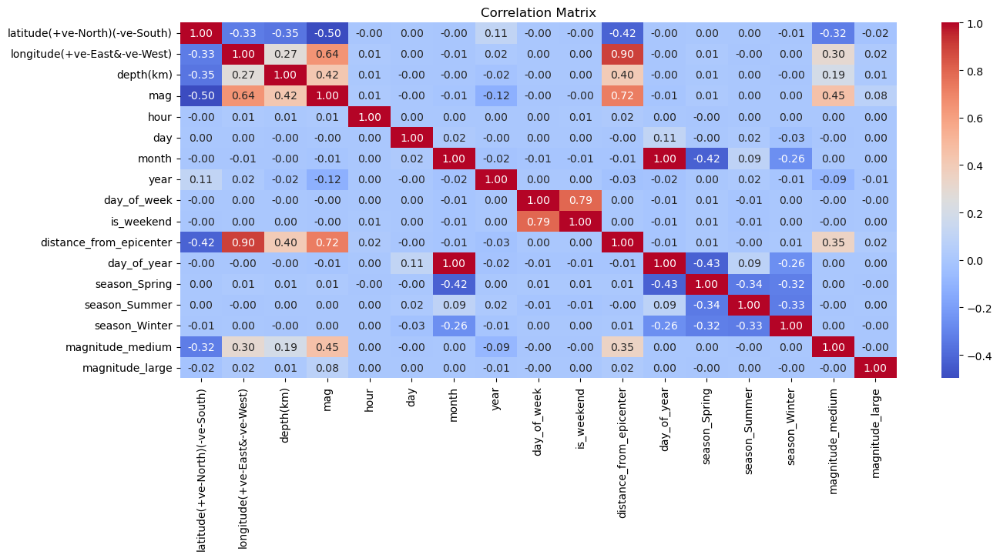

In [94]:
plt.figure(figsize=(15, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

In [95]:
correlation_matrix = df1.corr().abs()


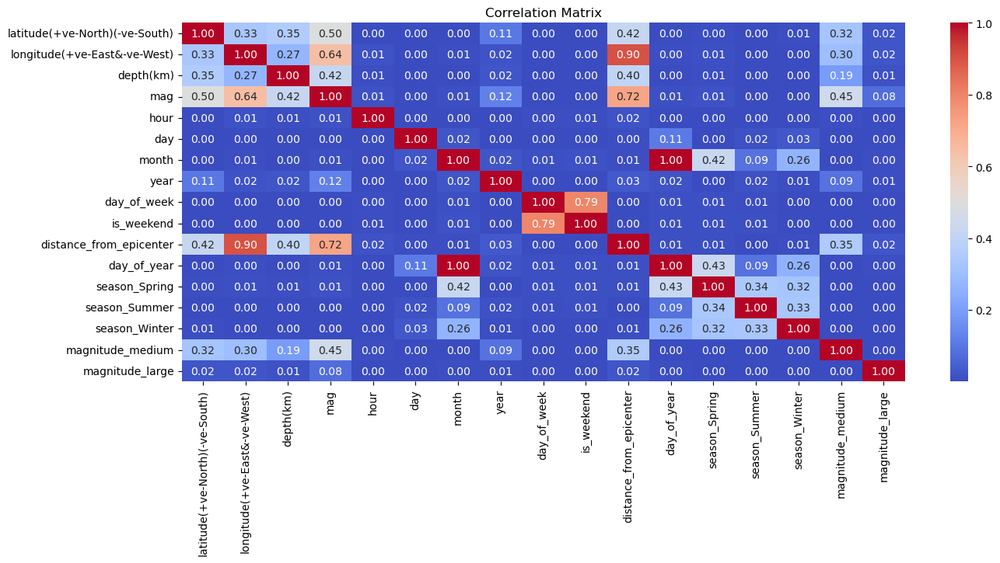

In [96]:
plt.figure(figsize=(15, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()
#convert negative value to positive

In [97]:
threshold = 0.7

bEFORE APPLING L.R MODEL....CHECK ( WE HAVE MULTIPLE FEATURES AVAILABLE IF FEATURES ARE HIGHLY CORRELATED THEN DROP THEM...SO THAT USE THRESHOLD)

In [98]:
correlated_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if correlation_matrix.iloc[i, j] > threshold:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

In [99]:
correlated_features

{'day_of_year', 'distance_from_epicenter', 'is_weekend'}

In [100]:
df1 = df1.drop(columns=correlated_features)

In [101]:
df1.columns

Index(['latitude(+ve-North)(-ve-South)', 'longitude(+ve-East&-ve-West)',
       'depth(km)', 'mag', 'hour', 'date', 'day', 'month', 'year',
       'day_of_week', 'season_Spring', 'season_Summer', 'season_Winter',
       'magnitude_medium', 'magnitude_large'],
      dtype='object')

In [102]:
continuous_columns = ['depth(km)', 'mag']

In [103]:
target_variable = 'mag'

Why we apply log transformation bcz..Linear Regression model Requirment:
1) data ka normally distribution ( for that we have to apply log.transformation)

In [104]:
df1_log = df1.copy()
df1_log[continuous_columns] = df1_log[continuous_columns].apply(np.log1p)

In [105]:
df1_log #dataset

,latitude(+ve-North)(-ve-South),longitude(+ve-East&-ve-West),depth(km),mag,hour,date,day,month,year,day_of_week,season_Spring,season_Summer,season_Winter,magnitude_medium,magnitude_large
0,34.189835,-117.588000,1.945910,0.993252,0,1973-01-01,1,1,1973,0,0,0,1,0,0
1,-9.214000,150.634000,3.737670,1.840550,3,1973-01-01,1,1,1973,0,0,0,1,1,0
2,48.308666,-122.117330,2.686486,1.163151,4,1973-01-01,1,1,1973,0,0,0,1,0,0
3,-15.012000,-173.958000,3.526361,1.791759,5,1973-01-01,1,1,1973,0,0,0,1,0,0
4,19.443666,-155.360840,2.116496,1.047319,7,1973-01-01,1,1,1973,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048570,35.406666,-120.972000,1.791093,1.150572,15,1997-08-11,11,8,1997,0,0,1,0,0,0
1048571,-29.489000,-179.065000,5.707110,1.589235,15,1997-08-11,11,8,1997,0,0,1,0,0,0
1048572,37.631332,-118.846664,1.349630,0.819780,15,1997-08-11,11,8,1997,0,0,1,0,0,0
1048573,37.650333,-118.854330,1.262996,0.662688,15,1997-08-11,11,8,1997,0,0,1,0,0,0


In [106]:
df1_log = df1_log.drop(['date'], axis = 1) # in ML..in prediction no require date drop it 

In [107]:
df1_log.duplicated().sum() # Why check bcz..due to date row is may be unique..but we drop itso that check duplicate and null also check

18

In [108]:
df1_log = df1_log.drop_duplicates()

In [109]:
df1_log.isnull().sum()

latitude(+ve-North)(-ve-South)    0
longitude(+ve-East&-ve-West)      0
depth(km)                         0
mag                               0
hour                              0
day                               0
month                             0
year                              0
day_of_week                       0
season_Spring                     0
season_Summer                     0
season_Winter                     0
magnitude_medium                  0
magnitude_large                   0
dtype: int64

In [110]:
df1_log.columns

Index(['latitude(+ve-North)(-ve-South)', 'longitude(+ve-East&-ve-West)',
       'depth(km)', 'mag', 'hour', 'day', 'month', 'year', 'day_of_week',
       'season_Spring', 'season_Summer', 'season_Winter', 'magnitude_medium',
       'magnitude_large'],
      dtype='object')

In [116]:
features = ['latitude(+ve-North)(-ve-South)','longitude(+ve-East&-ve-West)','depth(km)', 'mag', 'hour', 'day', 'month', 'year',
            'day_of_week', 'season_Spring', 'season_Summer', 'season_Winter',
            'magnitude_medium', 'magnitude_large']

Outliers are present in out data ( from Box plot we can say) 

In [118]:
def find_outliers_iqr(data, feature):
    Q1 = np.percentile(data[feature], 25)  
    Q3 = np.percentile(data[feature], 75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = data[(data[feature] < lower_bound) | (data[feature] > upper_bound)]
    return outliers

Here We have not removed outlier..bcz with range (25,75) our large data loss ho jayega..if we take (10,90) than we may remove outlier 
It depends On you What should be range...

In [119]:
for feature in features:
    outliers = find_outliers_iqr(df1_log, feature)
    print(f'Outliers in {feature}: {outliers.shape[0]}')
    outliers

Outliers in latitude(+ve-North)(-ve-South): 268575
Outliers in longitude(+ve-East&-ve-West): 335359
Outliers in depth(km): 63167
Outliers in mag: 2518
Outliers in hour: 0
Outliers in day: 0
Outliers in month: 0
Outliers in year: 0
Outliers in day_of_week: 0
Outliers in season_Spring: 259805
Outliers in season_Summer: 0
Outliers in season_Winter: 251534
Outliers in magnitude_medium: 30402
Outliers in magnitude_large: 299


## Linear Regression Model 

Linear Regression Model...........

In [120]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_squared_log_error, r2_score

In [121]:
X = df1_log.drop([target_variable], axis = 1)
y = df1_log[target_variable]

In [122]:
# Here We have drop our target from x axis and taken on y axis

In [123]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Here we have taken ration 2:8 (test:training)

In [124]:
model_lr = LinearRegression()
model_lr.fit(X_train, y_train)

LinearRegression()

In [125]:
y_pred = model_lr.predict(X_test)

In [126]:
mse = mean_squared_error(y_test, y_pred)
print(mse)

0.07272372678504818


In [127]:
rmse = np.sqrt(mse)
print(rmse)

0.26967337055231866


In [128]:
r2_lr = r2_score(y_test, y_pred)
print(r2_lr)

0.5088035926932406


In [129]:
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) score:", r2_lr)

Mean Squared Error (MSE): 0.07272372678504818
Root Mean Squared Error (RMSE): 0.26967337055231866
R-squared (R2) score: 0.5088035926932406


In [130]:
#Here our R2 score is 0.50 means itne percent hamara data fit ho rha he...so that we have applied
#hyperparameter tuning

In [131]:

from sklearn.model_selection import GridSearchCV




It looks like you're performing hyperparameter tuning for a Decision Tree Regressor using scikit-learn's GridSearchCV. This is a common approach to find the best combination of hyperparameters for a machine learning model. Here's a breakdown of what you're doing:

param_grid: You've defined a dictionary called param_grid that specifies the hyperparameters and their possible values that you want to search over. This grid defines potential values for the maximum depth of the tree (max_depth), the minimum number of samples required to split an internal node (min_samples_split), and the minimum number of samples required to be at a leaf node (min_samples_leaf).

dt_regressor: You've created an instance of the Decision Tree Regressor with default hyperparameters.

grid_search: You've created a GridSearchCV object, which is used for performing grid search with cross-validation. This means that the algorithm will train and evaluate the Decision Tree Regressor on different combinations of hyperparameters using cross-validation to estimate the model's performance.

dt_regressor: The base model you want to tune.
param_grid: The dictionary of hyperparameters and their possible values.
cv=5: This specifies 5-fold cross-validation, which means the dataset will be split into 5 subsets (folds), and the model will be trained and evaluated 5 times, each time using a different fold for validation.
scoring='neg_mean_squared_error': You've chosen the mean squared error as the scoring metric to evaluate the model's performance. The negative sign is used because scikit-learn's convention for scoring is to maximize values, but for error metrics like MSE, lower values are better. So, by using the negative MSE, you're effectively minimizing it.
grid_search.fit(X_train, y_train): This line of code fits the GridSearchCV object to your training data (X_train and y_train). It will explore all the combinations of hyperparameters specified in param_grid and select the combination that results in the best (lowest) mean squared error on the cross-validated data.

After this code is executed, you can access the best hyperparameters and the best estimator (the model with the best hyperparameters) using grid_search.best_params_ and grid_search.best_estimator_, respectively. You can then use the best estimator to make predictions on new data.




User
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
linear_reg = LinearRegression()
parameters = {
    'fit_intercept': [True, False],  # Whether to calculate the intercept
    'normalize': [True, False]  # Whether to normalize the features
}

scorer = make_scorer(mean_squared_error, greater_is_better=False)
grid_search = GridSearchCV(linear_reg, parameters, scoring=scorer, cv=5)
grid_search.fit(X_train, y_train)
ChatGPT
It appears that you're performing hyperparameter tuning for a Linear Regression model using scikit-learn's GridSearchCV. Here's what each part of your code does:

Import necessary libraries:

GridSearchCV from sklearn.model_selection: This class allows you to perform grid search with cross-validation.
make_scorer from sklearn.metrics: This function is used to create a custom scoring function for grid search.
Create a Linear Regression model:

linear_reg = LinearRegression(): You've created an instance of the Linear Regression model with default hyperparameters.
Define the hyperparameter grid:

parameters: You've defined a dictionary called parameters that specifies the hyperparameters you want to search over. In this case, you are considering two hyperparameters:
fit_intercept: This hyperparameter determines whether the model should calculate the intercept. It can take two values: True and False.
normalize: This hyperparameter determines whether the features should be normalized. It can take two values: True and False.
Create a custom scoring function:

scorer = make_scorer(mean_squared_error, greater_is_better=False): You've created a custom scoring function using make_scorer. This function uses the mean squared error (MSE) as the scoring metric, and greater_is_better=False indicates that lower MSE values are better. This custom scoring function will be used to evaluate the performance of different hyperparameter combinations.
Create a GridSearchCV object:

grid_search = GridSearchCV(linear_reg, parameters, scoring=scorer, cv=5): You've created a GridSearchCV object to perform grid search with cross-validation.
linear_reg: The base model you want to tune.
parameters: The dictionary of hyperparameters and their possible values.
scoring=scorer: You've specified the custom scoring function (MSE with lower values being better) to evaluate the model's performance.
cv=5: This specifies 5-fold cross-validation, which means the dataset will be split into 5 subsets (folds), and the model will be trained and evaluated 5 times, each time using a different fold for validation.
Fit the GridSearchCV object to your training data:

grid_search.fit(X_train, y_train): This line of code fits the GridSearchCV object to your training data (X_train and y_train). It will explore all the combinations of hyperparameters specified in parameters and select the combination that results in the best (lowest) mean squared error on the cross-validated data.
After this code is executed, you can access the best hyperparameters and the best estimator (the model with the best hyperparameters) using grid_search.best_params_ and grid_search.best_estimator_, respectively. You can then use the best estimator to make predictions on new data.

In [132]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
linear_reg = LinearRegression()
parameters = {
    'fit_intercept': [True, False],  # Whether to calculate the intercept
    'normalize': [True, False]  # Whether to normalize the features
}

scorer = make_scorer(mean_squared_error, greater_is_better=False)
grid_search = GridSearchCV(linear_reg, parameters, scoring=scorer, cv=5)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LinearRegression(),
             param_grid={'fit_intercept': [True, False],
                         'normalize': [True, False]},
             scoring=make_scorer(mean_squared_error, greater_is_better=False))

In [133]:
print("Best Parameters: ", grid_search.best_params_)
print("Best Mean Squared Error: ", -grid_search.best_score_)

Best Parameters:  {'fit_intercept': True, 'normalize': True}
Best Mean Squared Error:  0.07281668704291197


In [134]:
best_lr_model = LinearRegression(fit_intercept=True, normalize=True)
best_lr_model.fit(X_train, y_train)

LinearRegression(normalize=True)

In [135]:
y_pred = best_lr_model.predict(X_test)

In [136]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2_lr = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("R-squared (R2) score:", r2_lr)

Mean Squared Error: 0.07272372678504818
Root Mean Squared Error: 0.26967337055231866
R-squared (R2) score: 0.5088035926932406


In [137]:
#after applying hyperparameter tuning..still it does not change R2 score

In [138]:
from sklearn.tree import DecisionTreeRegressor

In [139]:
dt_regressor = DecisionTreeRegressor()

In [140]:
dt_regressor.fit(X_train, y_train)

DecisionTreeRegressor()

In [141]:
y_pred = dt_regressor.predict(X_test)

In [142]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2_dt = r2_score(y_test, y_pred)

In [143]:
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("R-squared (R2) score:", r2_dt)

Mean Squared Error: 0.05861748060277982
Root Mean Squared Error: 0.24211047189822216
R-squared (R2) score: 0.604081127985058


In [144]:
# HEre our R2 score us increased 0.6 so again check still we can improve??

In [145]:
param_grid = {
    'max_depth': [3, 5, 7, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

dt_regressor = DecisionTreeRegressor()
grid_search = GridSearchCV(dt_regressor, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(),
             param_grid={'max_depth': [3, 5, 7, 10],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]},
             scoring='neg_mean_squared_error')

In [146]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

In [147]:
best_model.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=10, min_samples_leaf=2, min_samples_split=10)

In [148]:
best_model.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=10, min_samples_leaf=2, min_samples_split=10)

In [149]:
y_pred = best_model.predict(X_test)

In [150]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2_dt = r2_score(y_test, y_pred)

In [151]:
print("Best Parameters:", best_params)
print("Best Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("R-squared (R2) score:", r2_dt)

Best Parameters: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 10}
Best Mean Squared Error: 0.041826284765316316
Root Mean Squared Error: 0.20451475439516906
R-squared (R2) score: 0.7174935648108616


In [152]:
#here we can seem that R2 is increased to  0.7

In [1]:
pip install tensorflow


  Using cached tensorflow-2.14.0-cp39-cp39-win_amd64.whl (2.1 kB)
     -------------------------------------- 284.1/284.1 MB 1.0 MB/s eta 0:00:00
     -------------------------------------- 440.7/440.7 kB 1.3 MB/s eta 0:00:00
     ---------------------------------------- 1.7/1.7 MB 1.6 MB/s eta 0:00:00
     ---------------------------------------- 24.4/24.4 MB 1.1 MB/s eta 0:00:00
     ---------------------------------------- 1.5/1.5 MB 1.2 MB/s eta 0:00:00
     -------------------------------------- 938.4/938.4 kB 1.5 MB/s eta 0:00:00
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
     ---------------------------------------- 5.5/5.5 MB 1.6 MB/s eta 0:00:00
     ---------------------------------------- 15.8/15.8 MB 1.1 MB/s eta 0:00:00
     ---------------------------------------- 3.7/3.7 MB 1.3 MB/s eta 0:00:00
  Using cached google_pasta-0.2.0-py3-none-any.whl (57 kB)
     -------------------------------------- 130.2/130.2 kB 1.5 MB/s eta 0:00:00
     -----------------

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
daal4py 2021.6.0 requires daal==2021.4.0, which is not installed.
scipy 1.9.1 requires numpy<1.25.0,>=1.18.5, but you have numpy 1.26.0 which is incompatible.
numba 0.55.1 requires numpy<1.22,>=1.18, but you have numpy 1.26.0 which is incompatible.


## Deep Learning Model

In [153]:
from keras.models import Sequential
from keras.layers import Dense

In [154]:
model = Sequential()
model.add(Dense(64, activation='relu', input_dim=X_train.shape[1]))
model.add(Dense(1))  

In [155]:
model.compile(optimizer='adam', loss='mean_squared_error')

In [156]:
history = model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=1)

Epoch 1/10
26214/26214 [==============================] - 36s 1ms/step - loss: 36.2039
Epoch 2/10
26214/26214 [==============================] - 43s 2ms/step - loss: 0.3371
Epoch 3/10
26214/26214 [==============================] - 38s 1ms/step - loss: 0.3044
Epoch 4/10
26214/26214 [==============================] - 38s 1ms/step - loss: 0.2675
Epoch 5/10
26214/26214 [==============================] - 37s 1ms/step - loss: 0.2416
Epoch 6/10
26214/26214 [==============================] - 36s 1ms/step - loss: 0.2214
Epoch 7/10
26214/26214 [==============================] - 37s 1ms/step - loss: 0.1993
Epoch 8/10
26214/26214 [==============================] - 38s 1ms/step - loss: 0.1808
Epoch 9/10
26214/26214 [==============================] - 41s 2ms/step - loss: 0.1705
Epoch 10/10
26214/26214 [==============================] - 38s 1ms/step - loss: 0.1616


In [157]:
y_pred = model.predict(X_test)

6554/6554 [==============================] - 7s 1ms/step


In [158]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2_dl = r2_score(y_test, y_pred)

In [159]:
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) score:", r2_dl)

Mean Squared Error (MSE): 0.060034390009304474
Root Mean Squared Error (RMSE): 0.2450191625349015
R-squared (R2) score: 0.5945109252364942


In [186]:
from keras.layers import Dense, Dropout

In [187]:
model = Sequential()
model.add(Dense(128, activation='relu', input_dim=X_train.shape[1]))
model.add(Dropout(0.3))  # Dropout for regularization (exm..if we have 10 nueron then we'll take 70 % nueron only)
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.3))  # Dropout for regularization 
model.add(Dense(1))  # Output layer

In [188]:
model.compile(optimizer='adam', loss='mean_squared_error')

In [189]:
history = model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=1)

Epoch 1/10
26214/26214 [==============================] - 49s 2ms/step - loss: 27.4203
Epoch 2/10
26214/26214 [==============================] - 47s 2ms/step - loss: 0.1479
Epoch 3/10
26214/26214 [==============================] - 50s 2ms/step - loss: 0.1490
Epoch 4/10
26214/26214 [==============================] - 58s 2ms/step - loss: 0.1475
Epoch 5/10
26214/26214 [==============================] - 46s 2ms/step - loss: 0.1475
Epoch 6/10
26214/26214 [==============================] - 51s 2ms/step - loss: 0.1475
Epoch 7/10
26214/26214 [==============================] - 51s 2ms/step - loss: 0.1475
Epoch 8/10
26214/26214 [==============================] - 47s 2ms/step - loss: 0.1475
Epoch 9/10
26214/26214 [==============================] - 47s 2ms/step - loss: 0.1475
Epoch 10/10
26214/26214 [==============================] - 48s 2ms/step - loss: 0.1477


In [190]:
y_pred = model.predict(X_test)

6554/6554 [==============================] - 8s 1ms/step


In [193]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2_dl = r2_score(y_test, y_pred)

In [194]:
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) score:", r2_dl)

Mean Squared Error (MSE): 0.14806012548193723
Root Mean Squared Error (RMSE): 0.38478581767255565
R-squared (R2) score: -3.953203712803166e-05


In [160]:
df1_log.columns

Index(['latitude(+ve-North)(-ve-South)', 'longitude(+ve-East&-ve-West)',
       'depth(km)', 'mag', 'hour', 'day', 'month', 'year', 'day_of_week',
       'season_Spring', 'season_Summer', 'season_Winter', 'magnitude_medium',
       'magnitude_large'],
      dtype='object')

## Gen Al model (generate patterens)

## Noise(random data points)-----latent space-----> GENERATE----->Fake Data (generate_out)
## Real Data ----Discriminator----(Compare Real Data and Fake Data (generate_out))---feedback goes to Generate----Generator learns from mistakes and generate again this process run again & again

In [161]:
from tensorflow.keras import layers, models

In [165]:
import numpy as np 
import pandas as pd
from sklearn.preprocessing import MinMaxScaler 
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten 
from tensorflow.keras.layers import BatchNormalization  
from tensorflow.keras.layers import LeakyReLU  
from tensorflow.keras.models import Sequential, Model 

scaler = MinMaxScaler(feature_range=(-1, 1))
X_train_scaled = scaler.fit_transform(X_train)

data_shape = (13,)

latent_dim = 100

# Generator architecture
generator = Sequential()
generator.add(Dense(128, input_dim=latent_dim))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization(momentum=0.8))
generator.add(Dense(np.prod(data_shape), activation='tanh'))
generator.add(Reshape(data_shape))

# Discriminator architecture
discriminator = Sequential()
discriminator.add(Flatten(input_shape=data_shape))
discriminator.add(Dense(128))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dense(1, activation='sigmoid'))

discriminator.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

discriminator.trainable = False

# GAN
gan_input = Input(shape=(latent_dim,))
x = generator(gan_input)
gan_output = discriminator(x)

gan = Model(gan_input, gan_output)
gan.compile(loss='binary_crossentropy', optimizer='adam')

# GAN training
epochs = 3000
batch_size = 32

d_losses_real = []
d_losses_fake = []
g_losses = []

for epoch in range(epochs):
    # Train discriminator
    idx = np.random.randint(0, X_train_scaled.shape[0], batch_size)
    real_data = X_train_scaled[idx]
    labels_real = np.ones((batch_size, 1))

    noise = np.random.randn(batch_size, latent_dim)
    generated_data = generator.predict(noise)
    labels_fake = np.zeros((batch_size, 1))

    d_loss_real = discriminator.train_on_batch(real_data, labels_real)
    d_loss_fake = discriminator.train_on_batch(generated_data, labels_fake)
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

    # Train generator
    noise = np.random.randn(batch_size, latent_dim)
    labels_gan = np.ones((batch_size, 1))
    g_loss = gan.train_on_batch(noise, labels_gan)

    if epoch % 1000 == 0:
        print(f"Epoch: {epoch}, D Loss: {d_loss[0]}, Accuracy: {100*d_loss[1]}, G Loss: {g_loss}")
        
    d_losses_real.append(d_loss_real[0])
    d_losses_fake.append(d_loss_fake[0])
    g_losses.append(g_loss)

# Generate some earthquakes
def generate_earthquakes(n_samples):
    noise = np.random.randn(n_samples, latent_dim)
    generated_earthquakes = generator.predict(noise)
    generated_earthquakes = scaler.inverse_transform(generated_earthquakes.reshape(n_samples, -1))
    return pd.DataFrame(generated_earthquakes, columns=X_train.columns)

# Generate earthquakes
generated_earthquakes = generate_earthquakes(10)
print("Generated Earthquakes:")
print(generated_earthquakes)


1/1 [==============================] - 0s 70ms/step
Epoch: 0, D Loss: 0.6927614510059357, Accuracy: 53.125, G Loss: 0.6989634037017822
1/1 [==============================] - 0s 23ms/step
Epoch: 1000, D Loss: 0.5619951486587524, Accuracy: 70.3125, G Loss: 0.8347158432006836
1/1 [==============================] - 0s 21ms/step
Epoch: 2000, D Loss: 0.6172406077384949, Accuracy: 65.625, G Loss: 0.904013454914093
1/1 [==============================] - 0s 107ms/step
Generated Earthquakes:
   latitude(+ve-North)(-ve-South)  longitude(+ve-East&-ve-West)  depth(km)  \
0                       42.208927                   -129.528320   1.072927   
1                       77.222275                   -121.765152   4.251021   
2                       42.768105                   -164.408249   0.951400   
3                       49.965466                    -67.961273   3.855403   
4                       78.213989                   -140.454651   2.900955   
5                       38.986980            

In [ ]:
#For saving this data
#generated_earthquake.to_csv()

In [164]:
# Check the shape of your X_train data
print(X_train.shape)  # Should print (number_of_samples, 14)

# If X_train has only 13 features, you might need to adjust your data
# or your model architecture to include the missing feature.


(838845, 13)


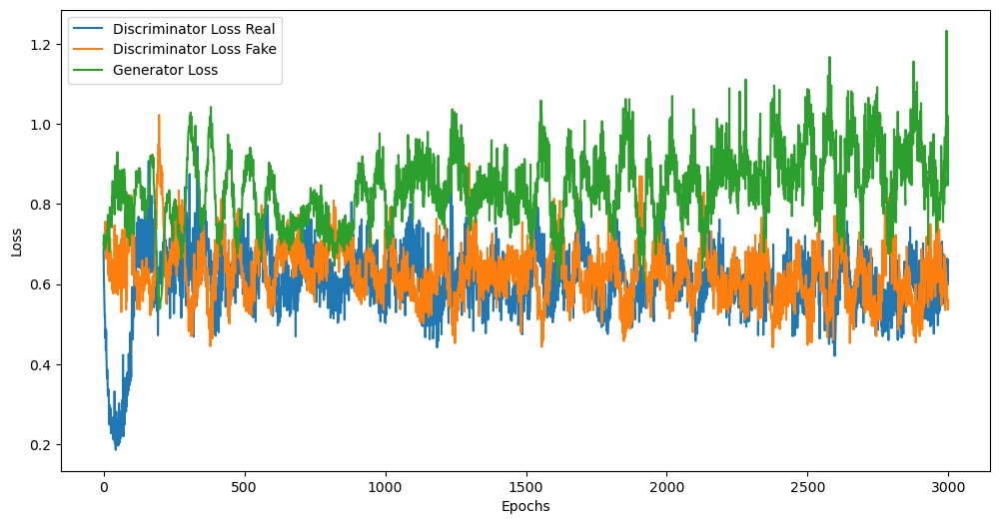

In [166]:
plt.figure(figsize=(12, 6))
plt.plot(d_losses_real, label="Discriminator Loss Real")
plt.plot(d_losses_fake, label="Discriminator Loss Fake")
plt.plot(g_losses, label="Generator Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [167]:
# Create a figure
fig = go.Figure()

# Add the loss traces
fig.add_trace(go.Scatter(x=list(range(len(d_losses_real))), y=d_losses_real, mode='lines', name='Discriminator Loss Real'))
fig.add_trace(go.Scatter(x=list(range(len(d_losses_fake))), y=d_losses_fake, mode='lines', name='Discriminator Loss Fake'))
fig.add_trace(go.Scatter(x=list(range(len(g_losses))), y=g_losses, mode='lines', name='Generator Loss'))

# Update the layout
fig.update_layout(title='GAN Losses',
                  xaxis_title='Epochs',
                  yaxis_title='Loss')

# Show the plot
fig.show()

## Time Series 

In [169]:
print(df1[features])

         latitude(+ve-North)(-ve-South)  longitude(+ve-East&-ve-West)  \
0                             34.189835                   -117.588000   
1                             -9.214000                    150.634000   
2                             48.308666                   -122.117330   
3                            -15.012000                   -173.958000   
4                             19.443666                   -155.360840   
...                                 ...                           ...   
1048570                       35.406666                   -120.972000   
1048571                      -29.489000                   -179.065000   
1048572                       37.631332                   -118.846664   
1048573                       37.650333                   -118.854330   
1048574                       44.086000                      7.943000   

         depth(km)   mag  hour  day  month  year  day_of_week  season_Spring  \
0            6.000  1.70     0    1      1 

In [170]:
Q1 = df1[features].quantile(0.25)
Q3 = df1[features].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df1_no_outliers = df1[features]

for col in df1[features]:
    df1_no_outliers = df1_no_outliers[(df1_no_outliers[col] >= lower_bound[col]) & (df1_no_outliers[col] <= upper_bound[col])]

In [171]:
df1_no_outliers

,latitude(+ve-North)(-ve-South),longitude(+ve-East&-ve-West),depth(km),mag,hour,day,month,year,day_of_week,season_Spring,season_Summer,season_Winter,magnitude_medium,magnitude_large
84,32.690500,-116.399000,9.860,2.26,0,1,6,1973,4,0,1,0,0,0
85,31.645166,-115.881000,6.000,3.23,0,1,6,1973,4,0,1,0,0,0
86,34.491833,-119.152336,6.000,2.32,1,1,6,1973,4,0,1,0,0,0
91,34.368830,-117.632330,5.950,1.70,8,1,6,1973,4,0,1,0,0,0
109,33.883500,-118.629000,6.000,2.20,3,1,7,1973,6,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048566,37.649834,-118.848335,3.616,1.52,14,11,8,1997,0,0,1,0,0,0
1048569,36.044834,-121.543335,4.260,1.67,14,11,8,1997,0,0,1,0,0,0
1048570,35.406666,-120.972000,4.996,2.16,15,11,8,1997,0,0,1,0,0,0
1048572,37.631332,-118.846664,2.856,1.27,15,11,8,1997,0,0,1,0,0,0


In [172]:
indices = df1_no_outliers.index
print(indices)

Int64Index([     84,      85,      86,      91,     109,     122,     129,
                134,     139,     142,
            ...
            1048556, 1048557, 1048558, 1048559, 1048561, 1048566, 1048569,
            1048570, 1048572, 1048573],
           dtype='int64', length=356575)


In [173]:
df1_filtered = df1.loc[indices]
print(df1_filtered)

         latitude(+ve-North)(-ve-South)  longitude(+ve-East&-ve-West)  \
84                            32.690500                   -116.399000   
85                            31.645166                   -115.881000   
86                            34.491833                   -119.152336   
91                            34.368830                   -117.632330   
109                           33.883500                   -118.629000   
...                                 ...                           ...   
1048566                       37.649834                   -118.848335   
1048569                       36.044834                   -121.543335   
1048570                       35.406666                   -120.972000   
1048572                       37.631332                   -118.846664   
1048573                       37.650333                   -118.854330   

         depth(km)   mag  hour       date  day  month  year  day_of_week  \
84           9.860  2.26     0 1973-06-01    1 

In [174]:
df1_filtered.shape

(356575, 15)

In [175]:
df2 = df1_filtered[["date","mag"]]

In [176]:
df2

,date,mag
84,1973-06-01,2.26
85,1973-06-01,3.23
86,1973-06-01,2.32
91,1973-06-01,1.70
109,1973-07-01,2.20
...,...,...
1048566,1997-08-11,1.52
1048569,1997-08-11,1.67
1048570,1997-08-11,2.16
1048572,1997-08-11,1.27


In [177]:
df2.set_index('date',inplace=True)

In [178]:
df2

,mag
date,
1973-06-01,2.26
1973-06-01,3.23
1973-06-01,2.32
1973-06-01,1.70
1973-07-01,2.20
...,...
1997-08-11,1.52
1997-08-11,1.67
1997-08-11,2.16


In [179]:
# resample('D'): This method is used to resample the time series data based on a specific frequency or time period. In this case, 'D' represents daily frequency, 
# which means you want to resample the data by day.

In [180]:
df2 = df2.resample('D').mean()

In [181]:
df2

,mag
date,
1973-06-01,2.377500
1973-06-02,2.070000
1973-06-03,1.466667
1973-06-04,1.966667
1973-06-05,1.910000
...,...
1997-11-06,1.329865
1997-11-07,1.269953
1997-11-08,1.600956


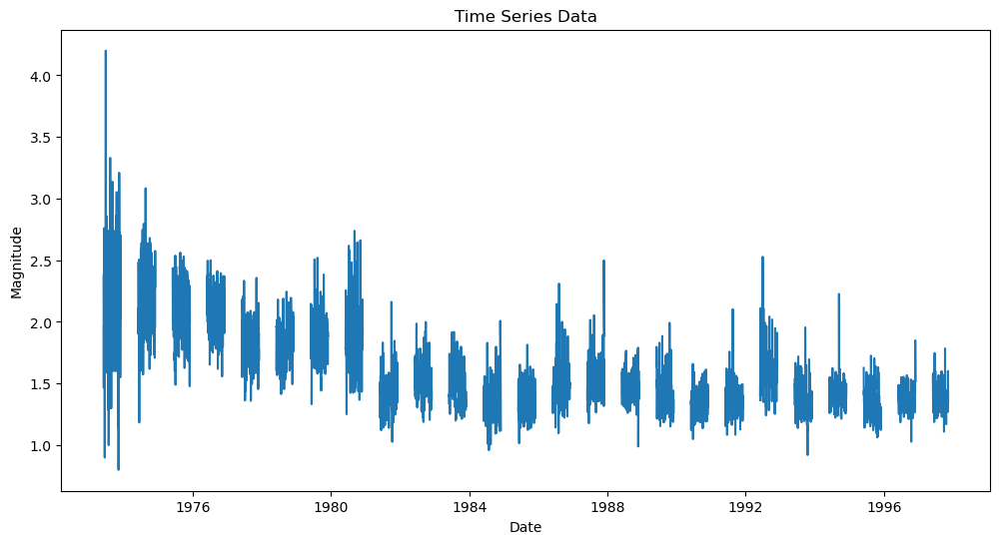

In [182]:
plt.figure(figsize=(12, 6))
plt.plot(df2['mag'])
plt.xlabel('Date')
plt.ylabel('Magnitude')
plt.title('Time Series Data')
plt.show()

In [183]:
fig = px.line(df2, x=df2.index, y='mag', title='Time Series Data', labels={'x': 'Date', 'y': 'Magnitude'})
fig.show()

In [184]:
from statsmodels.tsa.stattools import adfuller

In [185]:
result=adfuller(df2['mag'])

MissingDataError: exog contains inf or nans